<a href="https://colab.research.google.com/github/lRenadl/Heart-Failure-Prediction/blob/main/FinalReport.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **1- Problem**
Heart disease is frequently not diagnosed until it reaches an advanced stage, which can lead to serious complications and even death—many of which are avoidable. This project seeks to tackle the urgent need for early detection by examining key health indicators such as age, cholesterol, blood pressure, and symptoms triggered by physical activity. By applying predictive analytics and identifying underlying patterns, our goal is to provide healthcare professionals with data-supported tools that improve early diagnosis, allow for prompt treatment, and ultimately help reduce the number of deaths related to heart disease

# **2- Data Mining Task**
This study will apply two main data mining strategies: classification and clustering, to assess the risk of heart disease.
The classification technique will involve training a model to predict whether a patient is at risk of heart disease using various health-related features such as blood pressure, cholesterol levels, gender, age, and more. The model will be designed to focus specifically on identifying the presence or absence of heart disease.
In contrast, clustering will categorize patients into groups based on similar attributes, regardless of whether they have heart disease or not. This unsupervised method will help us uncover hidden patterns and relationships within the dataset, offering valuable insights into patient profiles.

# **3- Data**

The source of dataset:

https://www.kaggle.com/code/parsalatifi/heart-failure-prediction-95-accuracy-score


**To try to understand our data, we reviewed:**



In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import VarianceThreshold
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import Lasso
from sklearn.feature_selection import SelectKBest, f_classif
import pickle

df = pd.read_csv('Dataset.csv')

In [ ]:
data = pd.read_csv('Dataset.csv')
num_attributes = data.shape[1]
num_object = data.shape[0]
attribute_types = data.dtypes.to_frame( name = 'Data Types')
class_name = data.columns[-1]
class_label = data.columns[-1]

print(f"\033[1mGeneral iformation:\n")
print(f"\033[1mNumber of attributes:\033[0m {num_attributes}\n")
print(f"\033[1mNumber of objects:\033[0m {num_object}\n")
print(f"\033[1mClass lable:\033[0m {class_label}\n")
print(f"\033[1mAttribute types:\033[0m")
print(attribute_types)


General iformation:

Number of attributes: 12

Number of objects: 918

Class lable: HeartDisease

Attribute types:
               Data Types
Age                 int64
Sex                object
ChestPainType      object
RestingBP           int64
Cholesterol         int64
FastingBS           int64
RestingECG         object
MaxHR               int64
ExerciseAngina     object
Oldpeak           float64
ST_Slope           object
HeartDisease        int64


*As we can see, there are 918 objects, a total of 12 columns. Regarding data types, there are 6 integer attributes and 5 object attributes and 1 float attributes.*


**General information about the dataset:**
*   Number of attributes: 12
*   Number of objects: 918
*   Class label: HeartDisease

In [ ]:
data = {
    "Attribute Name": [
        "Age", "Sex", "ChestPainType", "RestingBP", "Cholesterol", "FastingBS",
        "RestingECG", "MaxHR", "ExerciseAngina", "Oldpeak", "ST_Slope", "HeartDisease"
    ],
    "Description": [
        "Patient's age",
        "Gender of the patient (values are 'M', 'F')",
        "Type of chest pain experienced",
        "Resting blood pressure (mm Hg)",
        "Serum cholesterol in mg/dl",
        "Fasting blood sugar > 120 mg/dl (1 = true; 0 = false)",
        "Resting electrocardiographic results",
        "Maximum heart rate achieved",
        "Exercise-induced angina (Yes/No)",
        "ST depression induced by exercise relative to rest",
        "Slope of the peak exercise ST segment",
        "Output class (1 = heart disease, 0 = no heart disease)"
    ],
    "Data Type": [
        "Numeric",     # Age
        "Nominal",     # Sex
        "Nominal",     # ChestPainType
        "Numeric",     # RestingBP
        "Numeric",     # Cholesterol
        "Binary",      # FastingBS
        "Nominal",     # RestingECG
        "Numeric",     # MaxHR
        "Nominal",     # ExerciseAngina
        "Numeric",     # Oldpeak
        "Ordinal",     # ST_Slope (ordered: Up > Flat > Down)
        "Binary"       # HeartDisease
    ],
    "Possible Values": [
        "Approximately 28–77",
        "'M', 'F'",
        "'TA', 'ATA', 'NAP', 'ASY'",
        "Approximately 80–200",
        "Approximately 100–600",
        "0, 1",
        "'Normal', 'ST', 'LVH'",
        "Approximately 60–210",
        "'Y', 'N'",
        "Float values (e.g., 0.0 to 6.2)",
        "'Up', 'Flat', 'Down'",
        "0, 1"
    ]
}

attributes_df = pd.DataFrame(data)
attributes_df.style.set_properties(**{'text-align': 'center'})


,Attribute Name,Description,Data Type,Possible Values
0,Age,Patient's age,Numeric,Approximately 28–77
1,Sex,"Gender of the patient (values are 'M', 'F')",Nominal,"'M', 'F'"
2,ChestPainType,Type of chest pain experienced,Nominal,"'TA', 'ATA', 'NAP', 'ASY'"
3,RestingBP,Resting blood pressure (mm Hg),Numeric,Approximately 80–200
4,Cholesterol,Serum cholesterol in mg/dl,Numeric,Approximately 100–600
5,FastingBS,Fasting blood sugar > 120 mg/dl (1 = true; 0 = false),Binary,"0, 1"
6,RestingECG,Resting electrocardiographic results,Nominal,"'Normal', 'ST', 'LVH'"
7,MaxHR,Maximum heart rate achieved,Numeric,Approximately 60–210
8,ExerciseAngina,Exercise-induced angina (Yes/No),Nominal,"'Y', 'N'"
9,Oldpeak,ST depression induced by exercise relative to rest,Numeric,"Float values (e.g., 0.0 to 6.2)"


## **Sample of the data**

In [ ]:
df.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.0,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.0,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.0,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.5,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.0,Up,0


## **Missing values**

In [ ]:
data = pd.read_csv('Dataset.csv')
## replace 0 (null value in certain culmns) with None
columns_to_check = ['Cholesterol', 'RestingBP', 'MaxHR', 'Age']
for column in columns_to_check:
    data[column] = data[column].replace(0, None)

print("Missing values in each column:")

missing_values_count = data.isnull().sum()
missing_rows = data[data.isnull().any(axis=1)]

print("Missing: ", missing_values_count)
print("\nRows with missing values:")
print(missing_rows)

print(f"\nWe have {missing_values_count.sum()} missing values, {missing_values_count['Cholesterol']} in Cholesterol and {missing_values_count['RestingBP']} in RestingBP.")


Missing values in each column:
Missing:  Age                 0
Sex                 0
ChestPainType       0
RestingBP           1
Cholesterol       172
FastingBS           0
RestingECG          0
MaxHR               0
ExerciseAngina      0
Oldpeak             0
ST_Slope            0
HeartDisease        0
dtype: int64

Rows with missing values:
     Age Sex ChestPainType RestingBP Cholesterol  FastingBS RestingECG  MaxHR  \
293   65   M           ASY       115        None          0     Normal     93   
294   32   M            TA        95        None          1     Normal    127   
295   61   M           ASY       105        None          1     Normal    110   
296   50   M           ASY       145        None          1     Normal    139   
297   57   M           ASY       110        None          1         ST    131   
..   ...  ..           ...       ...         ...        ...        ...    ...   
514   43   M           ASY       122        None          0     Normal    120   
515   6

## **Summary for data:**

In [ ]:
summary=df.describe();
print(summary);

              Age   RestingBP  Cholesterol   FastingBS       MaxHR  \
count  918.000000  918.000000   918.000000  918.000000  918.000000   
mean    53.510893  132.396514   198.799564    0.233115  136.809368   
std      9.432617   18.514154   109.384145    0.423046   25.460334   
min     28.000000    0.000000     0.000000    0.000000   60.000000   
25%     47.000000  120.000000   173.250000    0.000000  120.000000   
50%     54.000000  130.000000   223.000000    0.000000  138.000000   
75%     60.000000  140.000000   267.000000    0.000000  156.000000   
max     77.000000  200.000000   603.000000    1.000000  202.000000   

          Oldpeak  HeartDisease  
count  918.000000    918.000000  
mean     0.887364      0.553377  
std      1.066570      0.497414  
min     -2.600000      0.000000  
25%      0.000000      0.000000  
50%      0.600000      1.000000  
75%      1.500000      1.000000  
max      6.200000      1.000000  


## ***Statistical Summary for Numeric Features:***

#### **Show Five Number Summary:**
We used the summary_stats() function to explore the main statistics of the numeric columns. Here’s what we found:

- Age: The ages of the patients span from 28 to 77, with a median of 54 and a mean of 53.5, suggesting a population that is primarily middle-aged. 50% of the patients are 54 years or older, while 25% are below 47.

- RestingBP: The average resting blood pressure is 132.4, and the median is 130. With an interquartile range of 120 to 140, the data suggests that most patients have normal blood pressure. However, the minimum value of 0 points to potential data errors, which will be corrected later.

- Cholesterol: Most patients have cholesterol levels within the normal (<200) to borderline high (>240) range, with an interquartile range of 173 to 267. However, the minimum value of 0 suggests data errors, which will be corrected later.

- FastingBS: A large proportion of patients (76.7%) have normal fasting blood sugar levels (0), while a smaller group (23.3%) show elevated levels (1).

- MaxHR: The maximum heart rates range from 60 to 202, with a median of 138, reflecting a wide range of cardiovascular performance among the patients.

- Oldpeak: The interquartile range (IQR) of 0 to 1.5 indicates that the majority of patients show mild to moderate ST depression during exercise, which is often a sign of ischemia (reduced blood flow due to blocked or narrowed blood vessels) or heart disease.

- HeartDisease: The target variable reveals that 55.3% of patients have heart disease, while 44.7% do not, reflecting a nearly even distribution, with a small majority affected by heart disease.


---



Calculation used: IQR = Q3 - Q1. This metric represents the range of the middle 50% of the data, helping to identify inconsistencies, detect outliers, and understand the concentration of the data.

### **Show the Variance:**

In [ ]:
variance= df.var(numeric_only=True);
print(variance)

Age                88.974254
RestingBP         342.773903
Cholesterol     11964.891079
FastingBS           0.178968
MaxHR             648.228614
Oldpeak             1.137572
HeartDisease        0.247420
dtype: float64


Variance helps reveal how much the values in each column are spread out or dispersed. An increase in variance indicates that the data points are more widely spread from the mean, while a lower variance suggests that the values are more tightly clustered around the average. Therefore, our variance results indicate:


*   Age: The variance of 88.97 shows a moderate spread in patient ages, which matches the wide age range (28 to 77 years).

*   RestingBP: A high variance of 342.77 means there is a lot of difference in resting blood pressure values. This could be affected by an outlier (value 0), which may increase the overall variance.

*   Cholesterol: The very high variance of 11,964.89 shows large differences in cholesterol levels. This is mostly due to outliers (such as 0) and the wide range of values (0 to 603).

*   FastingBS: The low variance of 0.18 means that most patients have similar fasting blood sugar levels. Since many patients have a value of 0, the data is not very balanced.

*   MaxHR: The high variance of 648.23 shows that maximum heart rates vary a lot among patients, suggesting different levels of heart performance.

*   Oldpeak: The variance of 1.14 is low, meaning most patients have similar ST depression values during exercise.

*   HeartDisease: A variance of 0.25 suggests the data is fairly balanced between patients with and without heart disease.

When calculating the variance for a binary variable, the result is usually low because the only possible values are 0 and 1, which are numerically close. This limited range reduces the overall spread of the data.


## **Understanding the Data Through Graphical Representations:**

To investigate the relationship between heart disease and various features, visual tools such as graphs play a key role. The target variable, *HeartDisease*, distinguishes between individuals who have the condition and those who do not. By visualizing how this label relates to other attributes in the dataset, we can uncover meaningful patterns and determine whether increases in specific variables are linked to a higher risk of heart disease.

Additionally, these visualizations can highlight trends related to factors such as gender and age—revealing, for example, whether heart disease is more prevalent among men or women, and whether its likelihood increases with age. This visual approach aids in identifying major risk factors and potential early indicators of heart disease.

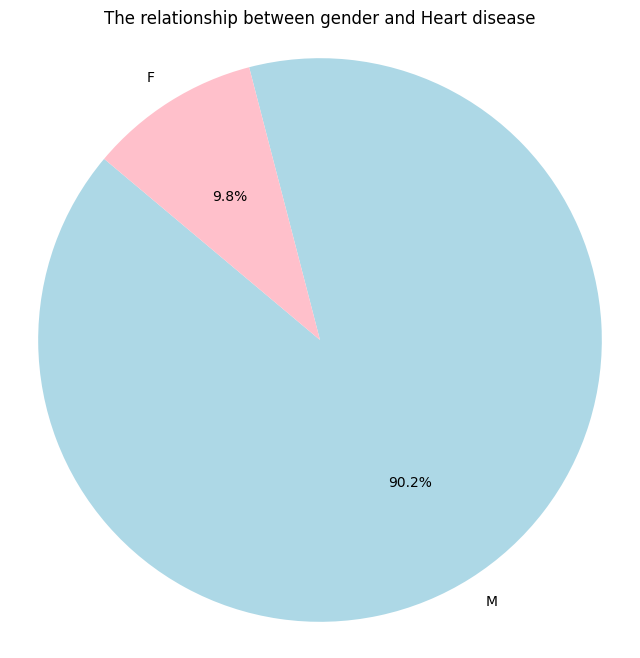

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

genderDiagnosisCounts = data[data['HeartDisease'] == 1]['Sex'].value_counts();
plt.figure(figsize=(8, 8));
plt.pie(genderDiagnosisCounts, labels=genderDiagnosisCounts.index, autopct='%1.1f%%', startangle=140, colors=['lightblue','pink']);
plt.title('The relationship between gender and Heart disease');
plt.axis('equal');
plt.show();

### Analyzing Heart Disease Through Graphs:

Graphs help visualize the relationship between heart disease and other factors. They reveal patterns, such as how age or gender may affect risk, and highlight key indicators that support early diagnosis.this results in 90.2% of men and 9.8% of female.

Text(0.5, 1.0, 'FastingBS')

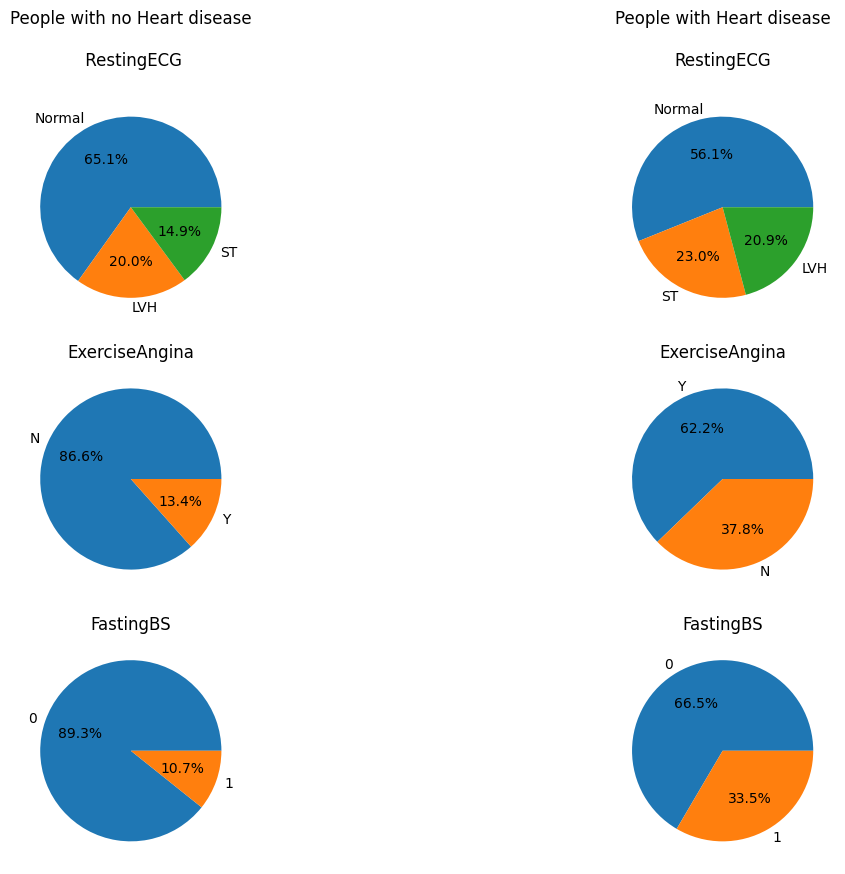

In [ ]:
fig,axs = plt.subplots(3,2,figsize = (14,10))
axs[0, 0].pie( data[data.HeartDisease == 0]['RestingECG'].value_counts(), labels= data[data.HeartDisease == 0]['RestingECG'].value_counts().index, autopct='%1.1f%%')
axs[0, 1].pie( data[data.HeartDisease == 1]['RestingECG'].value_counts(), labels= data[data.HeartDisease == 1]['RestingECG'].value_counts().index, autopct='%1.1f%%')
axs[0,0].set_title("People with no Heart disease\n\n RestingECG\n")
axs[0,1].set_title("People with Heart disease\n\nRestingECG\n")
axs[1, 0].pie( data[data.HeartDisease == 0]['ExerciseAngina'].value_counts(), labels= data[data.HeartDisease == 0]['ExerciseAngina'].value_counts().index, autopct='%1.1f%%')
axs[1,0].set_title("ExerciseAngina")
axs[1, 1].pie( data[data.HeartDisease == 1]['ExerciseAngina'].value_counts(), labels= data[data.HeartDisease == 1]['ExerciseAngina'].value_counts().index, autopct='%1.1f%%')
axs[1,1].set_title("ExerciseAngina")
axs[2, 0].pie( data[data.HeartDisease == 0]['FastingBS'].value_counts(), labels= data[data.HeartDisease == 0]['FastingBS'].value_counts().index, autopct='%1.1f%%')
axs[2,0].set_title("FastingBS")
axs[2, 1].pie( data[data.HeartDisease == 1]['FastingBS'].value_counts(), labels= data[data.HeartDisease == 1]['FastingBS'].value_counts().index, autopct='%1.1f%%')
axs[2,1].set_title("FastingBS")

### Key Patterns in Heart Disease Factors:

*   Fasting Blood Sugar: Elevated levels of fasting blood sugar are more frequently
observed in individuals with heart disease (33.5%) compared to those without (10.7%).

*   Resting ECG: Normal ECG readings are less common among those with heart disease (56.1%) than in those without (65.1%). Individuals with heart disease are more likely to display abnormalities, such as ST segment changes or left ventricular hypertrophy.

*   Exercise Angina: Individuals with heart disease are significantly more prone to experiencing exercise-induced angina (62.2%) compared to those without heart disease (13.4%).

These graphs illustrate crucial trends in heart disease, showing the strong relationships between heart disease and other health factors.

In [ ]:
data = pd.read_csv('Dataset.csv')

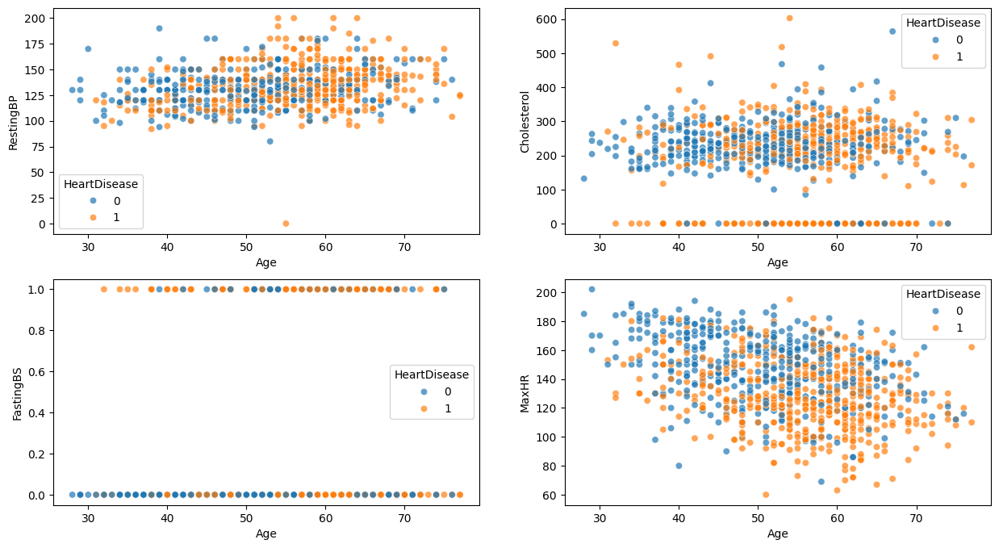

In [ ]:
fig,axes=plt.subplots(2,2,figsize=(15,8))
sns.scatterplot(data=data,x='Age',y='RestingBP',ax=axes[0][0],hue='HeartDisease',alpha=0.7)
sns.scatterplot(data=data,x='Age',y='Cholesterol',ax=axes[0][1],hue='HeartDisease',alpha=0.7)
sns.scatterplot(data=data,x='Age',y='FastingBS',ax=axes[1][0],hue='HeartDisease',alpha=0.7)
sns.scatterplot(data=data,x='Age',y='MaxHR',ax=axes[1][1],hue='HeartDisease',alpha=0.7)
plt.show()

### Key Indicators for Heart Disease:

*   MaxHR & FastingBS: Lower MaxHR and higher FastingBS are strong predictors of heart disease across all ages.
*   Cholesterol & RestingBP: High cholesterol and RestingBP are more significant in older age groups, particularly between 50 and 70.
*   FastingBS: A consistent factor in predicting heart disease, regardless of age or other health conditions.

<ipython-input-12-33e498f95002>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data['HeartDisease'], y=col, data=data, palette="Set2")
<ipython-input-12-33e498f95002>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data['HeartDisease'], y=col, data=data, palette="Set2")
<ipython-input-12-33e498f95002>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data['HeartDisease'], y=col, data=data, palette="Set2")
<ipython-input-12-33e498f95002>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in

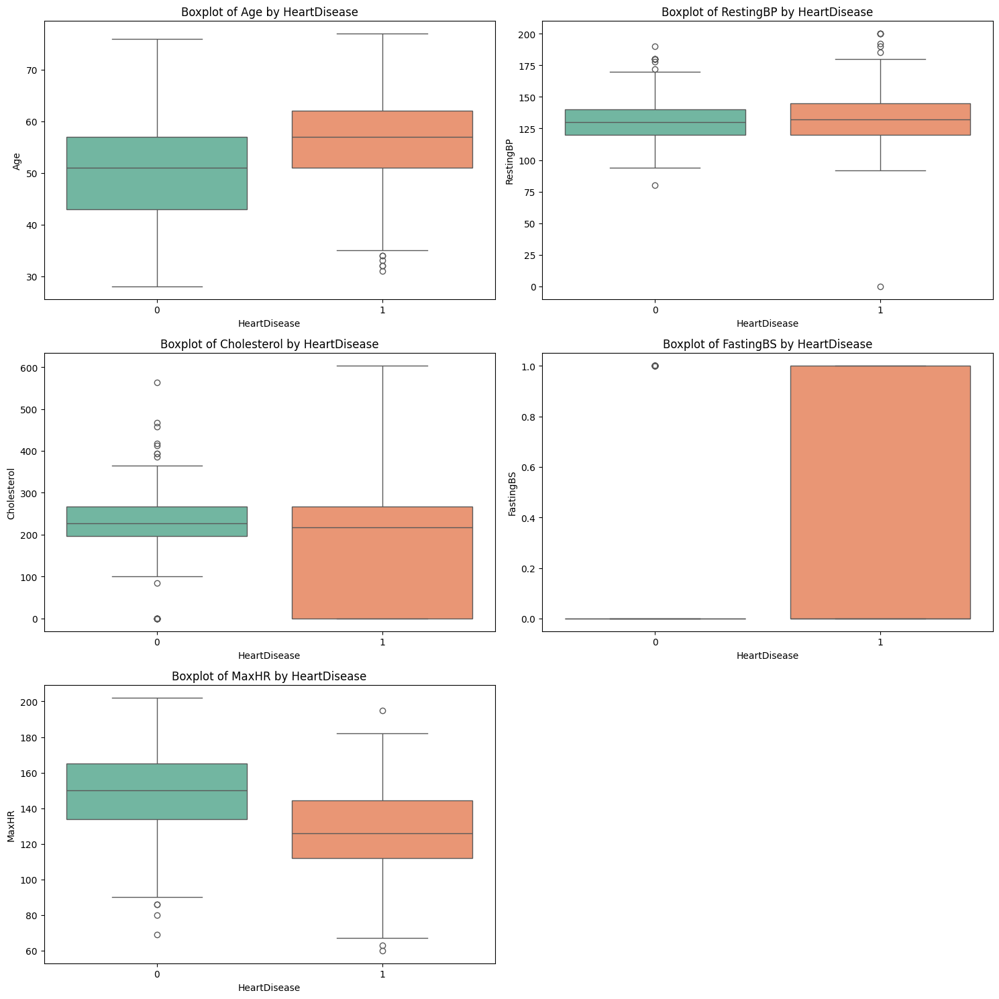

In [ ]:
plt.figure(figsize=(15,15))

for i, col in enumerate(data.columns[data.dtypes=='int64'].drop('HeartDisease'), 1):
    plt.subplot(3, 2, i)
    plt.title(f"Boxplot of {col} by HeartDisease")
    sns.boxplot(x=data['HeartDisease'], y=col, data=data, palette="Set2")
    plt.tight_layout()

plt.show()


### Heart Disease Insights:

*   Age: Patients with heart disease tend to be older, with a median age of 58 compared to 52 in those without the condition.

*   RestingBP: Heart disease cases show a broader range and more outliers, indicating increased risk.

*   Cholesterol: Higher cholesterol levels are more frequently observed in patients with heart disease, indicating a potential connection between cholesterol and heart-related issues.

*   Fasting Blood Sugar: Elevated fasting blood sugar is more common among heart disease patients, while lower levels are typical in non-patients.

*   MaxHR: Heart disease patients show a lower median maximum heart rate (140 bpm) and greater variability, unlike non-patients whose values are higher and more concentrated around 155 bpm.

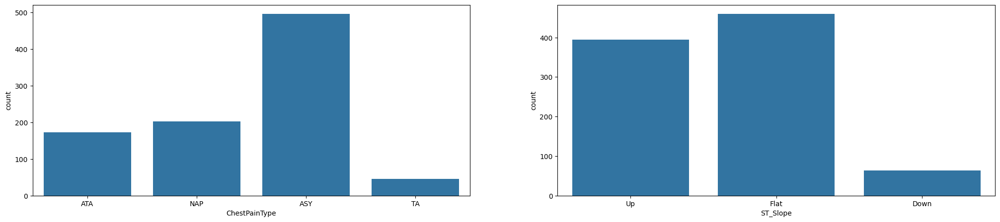

In [ ]:
cat = ['ChestPainType',  'ST_Slope']
plt.figure(figsize=(25, 5))
for i in range(len(cat)):
    plt.subplot(1, 2, i + 1)
    sns.countplot(x=cat[i], data=data)

This graph shows count plots for ChestPainType and ST_Slope in the heart disease dataset. Most individuals fall under the ASY (asymptomatic) chest pain type, meaning they don’t report noticeable symptoms. For ST_Slope, the majority have a Flat segment, which can indicate potential heart risks. These patterns suggest that both asymptomatic chest pain and a flat ST segment are common and may be linked to heart disease.

# **4- Data Preprocessing**


**Missing Values:**

The dataset contains 173 missing value.


In [ ]:
data = pd.read_csv('Dataset.csv')

## replace 0 (null value in certain culmns) with None
columns_to_check = ['Cholesterol', 'RestingBP', 'MaxHR', 'Age']
for column in columns_to_check:
    data[column] = data[column].replace(0, None)

missing_values_count = data.isnull().sum()
missing_rows = data[data.isnull().any(axis=1)]

print("Missing: ", missing_values_count)
print("\nRows with missing values:")
print(missing_rows)

Missing:  Age                 0
Sex                 0
ChestPainType       0
RestingBP           1
Cholesterol       172
FastingBS           0
RestingECG          0
MaxHR               0
ExerciseAngina      0
Oldpeak             0
ST_Slope            0
HeartDisease        0
dtype: int64

Rows with missing values:
     Age Sex ChestPainType RestingBP Cholesterol  FastingBS RestingECG  MaxHR  \
293   65   M           ASY       115        None          0     Normal     93   
294   32   M            TA        95        None          1     Normal    127   
295   61   M           ASY       105        None          1     Normal    110   
296   50   M           ASY       145        None          1     Normal    139   
297   57   M           ASY       110        None          1         ST    131   
..   ...  ..           ...       ...         ...        ...        ...    ...   
514   43   M           ASY       122        None          0     Normal    120   
515   63   M           NAP       130  

After examining the data, we noticed that some missing values were replaced with 0, which is unnatural for this type of data. To address this, we replaced the 0 values with 'None' so that we can accurately detect and handle the missing values. The code identifies and counts the missing values, and then it prints the rows containing missing data for further analysis.

**Replace missing data with the average**


After identifying the missing values, we calculated the mean for the relevant columns and used these values to fill in the missing data. We then checked the number of remaining missing values in each column to ensure that the process was successful.

In [ ]:
data = pd.read_csv('Dataset.csv')

# Calculate the mean values for Cholesterol and RestingBP
mean_values = data[['Cholesterol', 'RestingBP']].mean()

# Replace missing values with the calculated mean
data[['Cholesterol', 'RestingBP']] = data[['Cholesterol', 'RestingBP']].fillna(mean_values)

# Print the number of missing values in each column after the replacement
print('Missing: ', data.isna().sum())

Missing:  Age               0
Sex               0
ChestPainType     0
RestingBP         0
Cholesterol       0
FastingBS         0
RestingECG        0
MaxHR             0
ExerciseAngina    0
Oldpeak           0
ST_Slope          0
HeartDisease      0
dtype: int64


**show Duplicate Values:**


In [ ]:
duplicate_count = data.duplicated().sum()
print(f"Number of duplicate rows: {duplicate_count}")


Number of duplicate rows: 0


This indicates thet there are no duplicate rows in the dataset.


**Show outliers:**

In [ ]:
data = pd.read_csv('Dataset.csv')
##Identifying the outliers
outlier_threshold = 1.5

def count_outliers(column_data):
    q1 = np.percentile(column_data, 25)
    q3 = np.percentile(column_data, 75)
    iqr = q3 - q1
    upper_bound = q3 + outlier_threshold * iqr
    lower_bound = q1 - outlier_threshold * iqr
    outliers = (column_data > upper_bound) | (column_data < lower_bound)
    return sum(outliers)

##Selecting only the numerical columns
numeric_columns = ['Age', 'RestingBP', 'Cholesterol', 'MaxHR', 'Oldpeak']

outlier_counts = {}
total_rows_with_outliers = 0

for column in numeric_columns:
    outliers = count_outliers(data[column])
    outlier_counts[column] = outliers
    total_rows_with_outliers += outliers

total_rows = len(data)

print("Outlier Counts:")
for column, count in outlier_counts.items():
    print(f"{column}: {count} rows with outliers")
print(f"Total Rows with Outliers: {total_rows_with_outliers}")



Outlier Counts:
Age: 0 rows with outliers
RestingBP: 28 rows with outliers
Cholesterol: 183 rows with outliers
MaxHR: 2 rows with outliers
Oldpeak: 16 rows with outliers
Total Rows with Outliers: 229


**Removing the Outliers:**

In [ ]:
data = pd.read_csv('Dataset.csv')

outlier_threshold = 1.5

def count_outliers(column_data):
    q1 = np.percentile(column_data, 25)
    q3 = np.percentile(column_data, 75)
    iqr = q3 - q1
    upper_bound = q3 + outlier_threshold * iqr
    lower_bound = q1 - outlier_threshold * iqr
    outliers = (column_data > upper_bound) | (column_data < lower_bound)
    return sum(outliers)

##Selecting only the numerical columns
numeric_columns = ['Age', 'RestingBP', 'Cholesterol', 'MaxHR', 'Oldpeak']

outlier_counts = {}
total_rows = len(data)

for column in numeric_columns:
    outliers = count_outliers(data[column])
    outlier_counts[column] = outliers

    # Cap outliers by setting them to the nearest non-outlier value
    q1 = np.percentile(data[column], 25)
    q3 = np.percentile(data[column], 75)
    iqr = q3 - q1
    upper_bound = q3 + outlier_threshold * iqr
    lower_bound = q1 - outlier_threshold * iqr
    data[column] = np.clip(data[column], lower_bound, upper_bound)
data.to_csv('Cleaned_dataset.csv', index=False)


**Checking outliers Removal:**

In [ ]:
data1 = pd.read_csv('Cleaned_dataset.csv')
outlier_threshold = 1.5

def count_outliers(column_data1):
    q1 = np.percentile(column_data1, 25)
    q3 = np.percentile(column_data1, 75)
    iqr = q3 - q1
    upper_bound = q3 + outlier_threshold * iqr
    lower_bound = q1 - outlier_threshold * iqr
    outliers = (column_data1 > upper_bound) | (column_data1 < lower_bound)
    return sum(outliers)

##Selecting only the numerical columns
numeric_columns = ['Age', 'RestingBP', 'Cholesterol', 'MaxHR', 'Oldpeak']

outlier_counts = {}
total_rows_with_outliers = 0

for column in numeric_columns:
    outliers = count_outliers(data1[column])
    outlier_counts[column] = outliers
    total_rows_with_outliers += outliers

total_rows = len(data1)
print("Outlier Counts:")
for column, count in outlier_counts.items():
    print(f"{column}: {count} rows with outliers")

print(f"Total Rows with Outliers: {total_rows_with_outliers}")


Outlier Counts:
Age: 0 rows with outliers
RestingBP: 0 rows with outliers
Cholesterol: 0 rows with outliers
MaxHR: 0 rows with outliers
Oldpeak: 0 rows with outliers
Total Rows with Outliers: 0


 The code shows a total of 229 outliers, showing the occurrence of extreme values. To address this, we decided to cap the outliers rather than remove them, replacing them with the nearest non-outlier numbers. This method keeps the entire dataset while minimizing the influence of extreme values, keeping essential information for our analysis. The high number of outliers in the dataset indicates the presence of extreme values that differ significantly from the main cluster of data points. These outliers are data points that are much higher or lower than what is expected, showing significant differences from the usual patterns in the data. Their presence could result from several factors, including rare events, mistakes in data entry, or natural variability within the population being analyzed.

# **Data Transformation**

* **Encoding:**

In [ ]:
from sklearn.preprocessing import LabelEncoder
import pandas as pd

data1 = pd.read_csv('Cleaned_dataset.csv')
le = LabelEncoder()
categorical_columns = ['Sex', 'ChestPainType', 'RestingECG', 'ST_Slope', 'ExerciseAngina']
for col in categorical_columns:
    if col in data.columns:
        data[col] = le.fit_transform(data[col])
    else:
        print(f"Column '{col}' not found in the dataset!")
data.to_csv('Encoded_data.csv', index=False)
print("Data after Label Encoding:")
print(data.head())

Data after Label Encoding:
   Age  Sex  ChestPainType  RestingBP  Cholesterol  FastingBS  RestingECG  \
0   40    1              1        140        289.0          0           1   
1   49    0              2        160        180.0          0           1   
2   37    1              1        130        283.0          0           2   
3   48    0              0        138        214.0          0           1   
4   54    1              2        150        195.0          0           1   

   MaxHR  ExerciseAngina  Oldpeak  ST_Slope  HeartDisease  
0    172               0      0.0         2             0  
1    156               0      1.0         1             1  
2     98               0      0.0         2             0  
3    108               1      1.5         1             1  
4    122               0      0.0         2             0  


We encode the columns as following for better handling:

1. **Sex:**

**Before encoding:**

Categories was "M" For "Male" , "F" for "Female"

**After encoding:**

0 = Female 1 = Male

2. **ChestPainType:**

**Before encoding:**

Categories was "ATA" , "NAP" , "ASY" , "TA"

**After encoding:**

0 = ASY

1 = ATA

2 = NAP

3 = TA

3. **RestingECG:**

**Before encoding:**

Categories was "Normal" , "ST" , "LVH"

**After encoding:**

0 = LVH

1 = Normal

2 = ST

4. **ST_Slope:**

**Before encoding:**

Categories was "Up" , "Flat" , "Down"

**After encoding:**

0 = Down

1 = Flat

2 = Up

5. **ExerciseAngina:**

**Before encoding:**

Categories was "N" , "Y"

**After encoding:**

0 = N

1 = Y



* **Normalization:**

In [ ]:
data1 = pd.read_csv('Encoded_data.csv')
data1 = pd.DataFrame(data1)

columns_to_normalize = ['MaxHR','Cholesterol','RestingBP','Age','Oldpeak']

for column in columns_to_normalize:
    max_abs_value = data1[column].abs().max()
    data1[column] = data1[column] / (10 ** len(str(int(max_abs_value))))

print("DataFrame after Decimal Scaling Normalization:")
print(data1)
data1.to_csv('encoding_normalization.csv', index=False)


DataFrame after Decimal Scaling Normalization:
      Age  Sex  ChestPainType  RestingBP  Cholesterol  FastingBS  RestingECG  \
0    0.40    1              1      0.140        0.289          0           1   
1    0.49    0              2      0.160        0.180          0           1   
2    0.37    1              1      0.130        0.283          0           2   
3    0.48    0              0      0.138        0.214          0           1   
4    0.54    1              2      0.150        0.195          0           1   
..    ...  ...            ...        ...          ...        ...         ...   
913  0.45    1              3      0.110        0.264          0           1   
914  0.68    1              0      0.144        0.193          1           1   
915  0.57    1              0      0.130        0.131          0           1   
916  0.57    0              1      0.130        0.236          0           0   
917  0.38    1              2      0.138        0.175          0         

Here in the normalization process, we opted for Decimal Scaling to standardize the attributes and bring them to a unified scale, as the ranges of different attributes vary significantly. This step is crucial in ensuring that no single attribute disproportionately influences the analysis due to its larger numerical range. By normalizing key features such as MaxHR, Cholesterol, RestingBP, Age, and Oldpeak, we create a more balanced dataset where all values are on a comparable scale. This enhances the consistency of the data, making it easier to interpret and assess heart disease risk factors more effectively. Ultimately, this approach allows for a more accurate and meaningful analysis, improving the reliability of our results.

* **Aggregation:**

In [ ]:
data_aggregation=pd.read_csv('encoding_normalization.csv')

data_aggregation.groupby('Sex').agg(['max', 'min', 'mean'])

data_aggregation.groupby(['Sex', 'HeartDisease']).agg(['mean', 'max'])


Age       ChestPainType     RestingBP        \
                      mean   max          mean max      mean   max   
Sex HeartDisease                                                     
0   0             0.512028  0.76      1.237762   3  0.128580  0.17   
    1             0.561800  0.73      0.380000   3  0.140160  0.17   
1   0             0.502022  0.75      1.168539   3  0.130738  0.17   
    1             0.558690  0.77      0.456332   3  0.133164  0.17   

                 Cholesterol           FastingBS     RestingECG         MaxHR  \
                        mean       max      mean max       mean max      mean   
Sex HeartDisease                                                                
0   0               0.246087  0.407625  0.069930   1   0.916084   2  0.149049   
    1               0.229838  0.407625  0.320000   1   0.860000   2  0.137820   
1   0               0.218356  0.407625  0.127341   1   0.966292   2  0.147670   
    1               0.179639  0.407625  0.336245   1   1.039301   2  0.126566   

                        ExerciseAngina       Oldpeak         ST_Slope      
                    max           mean max      mean    max      mean max  
Sex HeartDisease                                                           
0   0             0.192       0.111888   1  0.043566  0.260  1.720280   2  
    1             0.174       0.540000   1  0.127700  0.375  1.020000   2  
1   0             0.202       0.146067   1  0.039157  0.375  1.749064   2  
    1             0.195       0.631004   1  0.125568  0.375  1.061135   2

We used an aggregation approach by grouping the data based on the “sex” and “HeartDisease” columns
 We then applied the “mean” function to examine the average values of various attributes within each group. This method allows us to observe how attribute averages differ between males and females, and between those with and without heart disease. Such grouping helps reveal meaningful patterns or variations in the data, offering insights into potential relationships between gender, heart disease status, and other variables. These findings can support deeper analysis and more informed decision-making later on
.

* **Discretization:**

In [ ]:
data = pd.read_csv('encoding_normalization.csv')
age_labels = ["Young Adults", "Middle-Aged", "Seniors"]
data["Age"] = pd.qcut(data["Age"], q=3, labels=age_labels)

restingbp_labels = ["Very Low", "Low", "Normal", "High"]
data["RestingBP"] = pd.qcut(data["RestingBP"], q=4, labels=restingbp_labels)


cho_labels = ["Low", "Medium", "High"]
data["Cholesterol"] = pd.qcut(data["Cholesterol"], q=3, labels=cho_labels)


maxhr_labels = ["Low", "medium", "High"]
data["MaxHR"] = pd.qcut(data["MaxHR"], q=3, labels=maxhr_labels)


oldpeak_labels = ["No Depression", "Mild Depression", "Severe Depression"]
data["Oldpeak"] = pd.qcut(data["Oldpeak"], q=3, labels=oldpeak_labels)


print(data)
data.to_csv('after_discretization.csv', index=False)

              Age  Sex  ChestPainType RestingBP Cholesterol  FastingBS  \
0    Young Adults    1              1    Normal        High          0   
1    Young Adults    0              2      High         Low          0   
2    Young Adults    1              1       Low        High          0   
3    Young Adults    0              0    Normal      Medium          0   
4     Middle-Aged    1              2      High         Low          0   
..            ...  ...            ...       ...         ...        ...   
913  Young Adults    1              3  Very Low        High          0   
914       Seniors    1              0      High         Low          1   
915   Middle-Aged    1              0       Low         Low          0   
916   Middle-Aged    0              1       Low      Medium          0   
917  Young Adults    1              2    Normal         Low          0   

     RestingECG   MaxHR  ExerciseAngina            Oldpeak  ST_Slope  \
0             1    High               0

In this discretization process, we categorized the attributes as follows:

**Age:**

* Categories:

    Young Adults : 28-50 years

    Middle-Aged : 50-58 years

    Seniors : 58+ years

*Reason for Discretization:*

*To simplify the analysis of age groups and their potential impact on heart disease risk.*


**Resting Blood Pressure:**

* Categories:

    Very Low : 0-120 mmHg

    Low : 120-130 mmHg

    Normal : 130-140 mmHg

    High : 140-200 mmHg

*Reason for Discretization:*

*To clearly distinguish between blood pressure levels and understand their influence on heart health.*


**Cholesterol Levels:**

* Categories:

    Low : 0-197 mg/dL

    Medium : 197-250 mg/dL
    
    High : 250-603 mg/dL

*Reason for Discretization:*

*To facilitate comparisons between cholesterol levels and their correlation with heart disease risk.*

**Maximum Heart Rate:**

* Categories:

    Low : 60-125 bpm

    Medium : 125-150 bpm

    High : 150-202 bpm

*Reason for Discretization:*

*To evaluate the impact of heart rate ranges on cardiovascular health and fitness levels.*


**Oldpeak ( Depression Level ):**

* Categories:

    No Depression : -2.6 to 0

    Mild Depression : 0 to 1.2

    Severe Depression : 1.2 to 6.2

*Reason for Discretization:*

*To assess the severity of exercise-induced depression and its relation to heart health.*

**This method helps us concentrate on general trends and patterns within specific groups instead of working with continuous values, offering valuable insights into the unique behavior and characteristics of each group. Furthermore, discretization improves the efficiency of our machine learning models by making data analysis and interpretation more straightforward. As a result, it supports more informed decision-making and allows us to better cater to the specific needs of each attribute group.**


# **Feature Selection:**


**Chi-Square:**

We need to focus on categorical attributes to apply the Chi-square test and determine uncorrelated attributes with respect to the class label "HeartDisease". The categorical attribute in our dataset after applying all data transformation methods is "Age".


In [ ]:
data = pd.read_csv('after_discretization.csv')

# List of categorical columns to test
categorical_columns = ['Age', 'RestingBP', 'Cholesterol', 'MaxHR', 'Oldpeak']

# Function to perform Chi-square test for each categorical column
def chi_square_test(data, target_col, cat_cols):
    results = {}
    for col in cat_cols:
        # Create a contingency table
        contingency_table = pd.crosstab(data[col], data[target_col])

        # Perform the Chi-square test
        chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

        # Store the result
        results[col] = {
            'Chi-square Statistic': chi2_stat,
            'Degrees of Freedom': dof,
            'expected':expected
        }
    return results
    # Apply the Chi-square test
chi_square_results = chi_square_test(data, 'HeartDisease', categorical_columns)

# Display the results
for column, result in chi_square_results.items():
    print(f"Column: {column}")
    print(f"Chi-square Statistic: {result['Chi-square Statistic']}")
    print(f"Degrees of Freedom: {result['Degrees of Freedom']}")
    print(f"Expected:")
    print(f"{result['expected']}\n")


Column: Age
Chi-square Statistic: 65.08090035638334
Degrees of Freedom: 2
Expected:
[[140.23965142 173.76034858]
 [128.62745098 159.37254902]
 [141.1328976  174.8671024 ]]

Column: RestingBP
Chi-square Statistic: 20.97630037410108
Degrees of Freedom: 3
Expected:
[[ 98.25708061 121.74291939]
 [ 89.32461874 110.67538126]
 [ 91.5577342  113.4422658 ]
 [130.86056645 162.13943355]]

Column: Cholesterol
Chi-square Statistic: 30.782274715683553
Degrees of Freedom: 2
Expected:
[[136.22004357 168.77995643]
 [138.00653595 170.99346405]
 [135.77342048 168.22657952]]

Column: MaxHR
Chi-square Statistic: 146.58661140651304
Degrees of Freedom: 2
Expected:
[[124.16122004 153.83877996]
 [144.25925926 178.74074074]
 [141.5795207  175.4204793 ]]

Column: Oldpeak
Chi-square Statistic: 148.50725792086038
Degrees of Freedom: 2
Expected:
[[105.8496732  131.1503268 ]
 [170.16339869 210.83660131]
 [133.9869281  166.0130719 ]]




**Correlation Coefficient:**

In [ ]:
data = pd.read_csv('after_discretization.csv')

cor_Sex = data['Sex'].corr(data['HeartDisease'])
cor_ChestPainType = data['ChestPainType'].corr(data['HeartDisease'])
cor_FastingBS = data['FastingBS'].corr(data['HeartDisease'])
cor_ExerciseAngina = data['ExerciseAngina'].corr(data['HeartDisease'])
cor_ST_Slope = data['ST_Slope'].corr(data['HeartDisease'])
cor_RestingECG = data['RestingECG'].corr(data['HeartDisease'])

print(f'Correlation Coefficient: ')
print("Sex:", cor_Sex)
print("ChestPainType:", cor_ChestPainType)
print("FastingBS:", cor_FastingBS)
print("ExerciseAngina:", cor_ExerciseAngina)
print("ST_Slope :", cor_ST_Slope )
print("RestingECG  :", cor_RestingECG)

Correlation Coefficient: 
Sex: 0.3054449159631395
ChestPainType: -0.3868276942625648
FastingBS: 0.26729118611029784
ExerciseAngina: 0.4942819918242682
ST_Slope : -0.558770714849704
RestingECG  : 0.057384357013450994


# **Feature Selection Analysis:**

**Chi-square:**

After reviewing the probability (alpha) table, we chose the significance level of 0.05; therefore, the critical value is 5.991. When comparing the Chi-square statistics to the critical value, we see that the Chi-square statistics for every attribute in the test is greater than the critical value ( 65 > 5.9917), ( 21 > 5.9917), ( 31 > 5.9917), ( 147 > 5.9917), ( 149 > 5.9917).

This means that all the categorical attributes provide valuable information for predicting whether or not a patient has heart disease. Therefore, the correlation is stronger in this case, leading us to **keep all of the categorical attributes.**

**Correlation Coefficient:**

ST_Slope (-0.56): The strongest negative correlation with heart disease, suggests that a steeper decline in the ST segment, is linked to a higher likelihood of heart disease.

ExerciseAngina (0.49): The strongest positive correlation, suggesting that patients who experience angina during exercise are associated with the likelihood of heart disease.

ChestPainType (-0.39): Moderate negative correlation, meaning a certain types of chest pain are inversely associated with the likelihood of heart disease.

Sex (0.31): Moderate positive correlation, suggesting that one of the sexes is more likely to have heart disease compared to the other.

FastingBS (0.27): Weak positive correlation, indicating that patients with elevated fasting blood sugar are slightly more likely to have heart disease.

RestingECG (0.06): Very weak correlation, meaning that the resting electrocardiogram results have almost no linear relationship with the presence of heart disease.

In conclusion, and based on the results, we decided to **delete the RestingECG **column due to its weak correlation (0.06) with heart disease.

**Drop uncorrelated columns:**

In [ ]:
data= pd.read_csv('after_discretization.csv')
data= data.drop(['RestingECG'], axis=1)

data.to_csv('Preprocessed_dataset.csv', index=False)
print(data)

              Age  Sex  ChestPainType RestingBP Cholesterol  FastingBS  \
0    Young Adults    1              1    Normal        High          0   
1    Young Adults    0              2      High         Low          0   
2    Young Adults    1              1       Low        High          0   
3    Young Adults    0              0    Normal      Medium          0   
4     Middle-Aged    1              2      High         Low          0   
..            ...  ...            ...       ...         ...        ...   
913  Young Adults    1              3  Very Low        High          0   
914       Seniors    1              0      High         Low          1   
915   Middle-Aged    1              0       Low         Low          0   
916   Middle-Aged    0              1       Low      Medium          0   
917  Young Adults    1              2    Normal         Low          0   

      MaxHR  ExerciseAngina            Oldpeak  ST_Slope  HeartDisease  
0      High               0      No De

# **5- Data Mining Technique**

We applied both supervised and unsupervised learning techniques to analyze the dataset

—specifically
 **classification** and **clustering.**

***Classification:***

To perform classification, we used a supervised learning approach to predict the presence of heart disease in individuals. The dataset was split into training and testing sets to evaluate model performance using accuracy, sensitivity, specificity, and precision.
We selected decision trees as our classification model for their clarity in presenting results and ease of interpretation.
The model was built using the DecisionTreeClassifier from the scikit-learn Python library.

The decision tree structure allowed us to explore how features such as sex, chest pain type, cholesterol, blood pressure, heart rate, and ST segment characteristics affect the likelihood of heart disease. We compared two splitting criteria—Entropy and Gini Index—to assess model behavior. Additionally, we tested multiple data splitting ratios (70/30, 80/20, and 60/40) to determine the best performing configuration for our dataset.

***Clustering:***

For unsupervised learning, we applied the K-means clustering algorithm to discover hidden patterns and groupings within the data. The KMeans implementation from scikit-learn was used, and we excluded the “heart disease” label to avoid bias in the clustering process. All other features were included to identify natural groupings in the data.

To evaluate clustering effectiveness, we calculated the Silhouette Score for different values of K (2, 3, and 4) and analyzed the Within-Cluster Sum of Squares (WSS) to determine the optimal number of clusters.
These evaluation metrics helped us balance between compactness and separation of clusters, leading to meaningful insights without relying on predefined label.

# Loading Data

italicized text# Loading Data View data to determine the Class Label and its location

In [ ]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy import stats
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score, classification_report
from sklearn.preprocessing import LabelEncoder


data = pd.read_csv('Preprocessed_dataset.csv')


print(data)


              Age  Sex  ChestPainType RestingBP Cholesterol  FastingBS  \
0    Young Adults    1              1    Normal        High          0   
1    Young Adults    0              2      High         Low          0   
2    Young Adults    1              1       Low        High          0   
3    Young Adults    0              0    Normal      Medium          0   
4     Middle-Aged    1              2      High         Low          0   
..            ...  ...            ...       ...         ...        ...   
913  Young Adults    1              3  Very Low        High          0   
914       Seniors    1              0      High         Low          1   
915   Middle-Aged    1              0       Low         Low          0   
916   Middle-Aged    0              1       Low      Medium          0   
917  Young Adults    1              2    Normal         Low          0   

      MaxHR  ExerciseAngina            Oldpeak  ST_Slope  HeartDisease  
0      High               0      No De

# Encoding:

Since our dataset includes categorical columns, and scikit-learn only accepts numerical data, we'll need to encode these categorical features.

In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Read the dataset from the transmitted file
data = pd.read_csv('Preprocessed_dataset.csv')

# Initialize the LabelEncoder
le = LabelEncoder()

# List of categorical columns to encode (keep the same columns as before)
categorical_cols = ['Age', 'Cholesterol', 'RestingBP', 'MaxHR', 'Oldpeak']

# Apply Label Encoding to each categorical column if it exists in the dataset
for col in categorical_cols:
    if col in data.columns:
        data[col] = le.fit_transform(data[col])
    else:
        print(f"Column '{col}' not found in the dataset!")

# Save the encoded dataset to a CSV file
data.to_csv('Encoded_Preprocessed_dataset.csv', index=False)

# Print the encoded dataset
print(data)


     Age  Sex  ChestPainType  RestingBP  Cholesterol  FastingBS  MaxHR  \
0      2    1              1          2            0          0      0   
1      2    0              2          0            1          0      0   
2      2    1              1          1            0          0      1   
3      2    0              0          2            2          0      1   
4      0    1              2          0            1          0      1   
..   ...  ...            ...        ...          ...        ...    ...   
913    2    1              3          3            0          0      2   
914    1    1              0          0            1          1      2   
915    0    1              0          1            1          0      1   
916    0    0              1          1            2          0      0   
917    2    1              2          2            1          0      0   

     ExerciseAngina  Oldpeak  ST_Slope  HeartDisease  
0                 0        1         2             0  
1

# Feature Selection

chooses the variables (features) to be utilized in training, which are kept in the variable "X," as well as the variable from the dataset that has the right classifications (class labels), which is kept in the variable "y."

In [ ]:
fn= data.keys().tolist()[:-1]
X= data[fn]
y=data['HeartDisease']
print(X)

     Age  Sex  ChestPainType  RestingBP  Cholesterol  FastingBS  MaxHR  \
0      2    1              1          2            0          0      0   
1      2    0              2          0            1          0      0   
2      2    1              1          1            0          0      1   
3      2    0              0          2            2          0      1   
4      0    1              2          0            1          0      1   
..   ...  ...            ...        ...          ...        ...    ...   
913    2    1              3          3            0          0      2   
914    1    1              0          0            1          1      2   
915    0    1              0          1            1          0      1   
916    0    0              1          1            2          0      0   
917    2    1              2          2            1          0      0   

     ExerciseAngina  Oldpeak  ST_Slope  
0                 0        1         2  
1                 0        0 

##**6- Evaluation and Comparison**

- #### **Classification**
Information Gain (Entropy):


- ### **Classification [70% training, 30% testing] Information Gain:**

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

# Split the dataset into training and testing subsets
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.3,
    random_state=1
)

# Initialize the Decision Tree Classifier using entropy as criterion
classifier = DecisionTreeClassifier(criterion='entropy', random_state=1)

# Fit the classifier to the training data
classifier.fit(X_train, y_train)

# Predict labels for the test dataset
y_pred = classifier.predict(X_test)


- ### **confusion matrix:**

[[ 84  25]
 [ 40 127]]


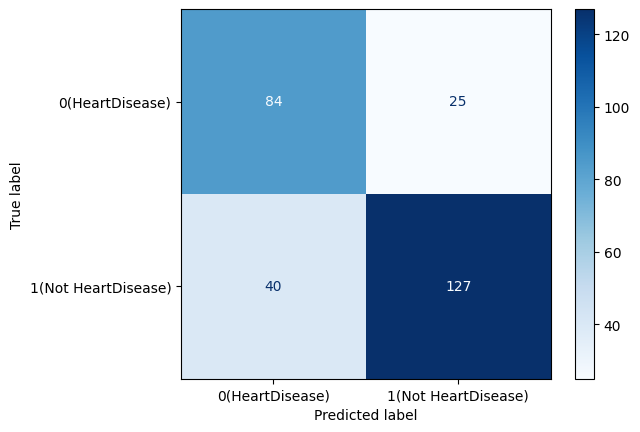

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute the confusion matrix and print it
cm = confusion_matrix(y_test, y_pred)
print(cm)

# Define custom class labels for display
class_labels = {0: '0(HeartDisease)', 1: '1(Not HeartDisease)'}

# Create the ConfusionMatrixDisplay with the custom labels
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=[class_labels[0], class_labels[1]])

# Plot the confusion matrix using the 'Blues' colormap
disp.plot(cmap=plt.cm.Blues)
plt.show()


The confusion matrix illustrates the performance of the classification model by comparing predicted labels (columns) with the actual labels (rows). Based on the provided confusion matrix:

- **Top-left (True Positive, TP = 84):** 84 cases were accurately classified as "HeartDisease."

- **Top-right (False Negative, FN = 25):** 25 cases actually having "HeartDisease" were mistakenly classified as "Not HeartDisease."

- **Bottom-left (False Positive, FP = 40):** 40 cases actually without "HeartDisease" were incorrectly identified as having "HeartDisease."

- **Bottom-right (True Negative, TN = 127):** 127 cases were correctly classified as "Not HeartDisease."

### Insight:
**The model:**

- correctly identified 84 cases of HeartDisease and 127 cases of Not HeartDisease.

- However, it incorrectly classified 25 individuals with HeartDisease as healthy, and wrongly predicted 40 healthy individuals as having HeartDisease.

- ### **Decision Tree:**

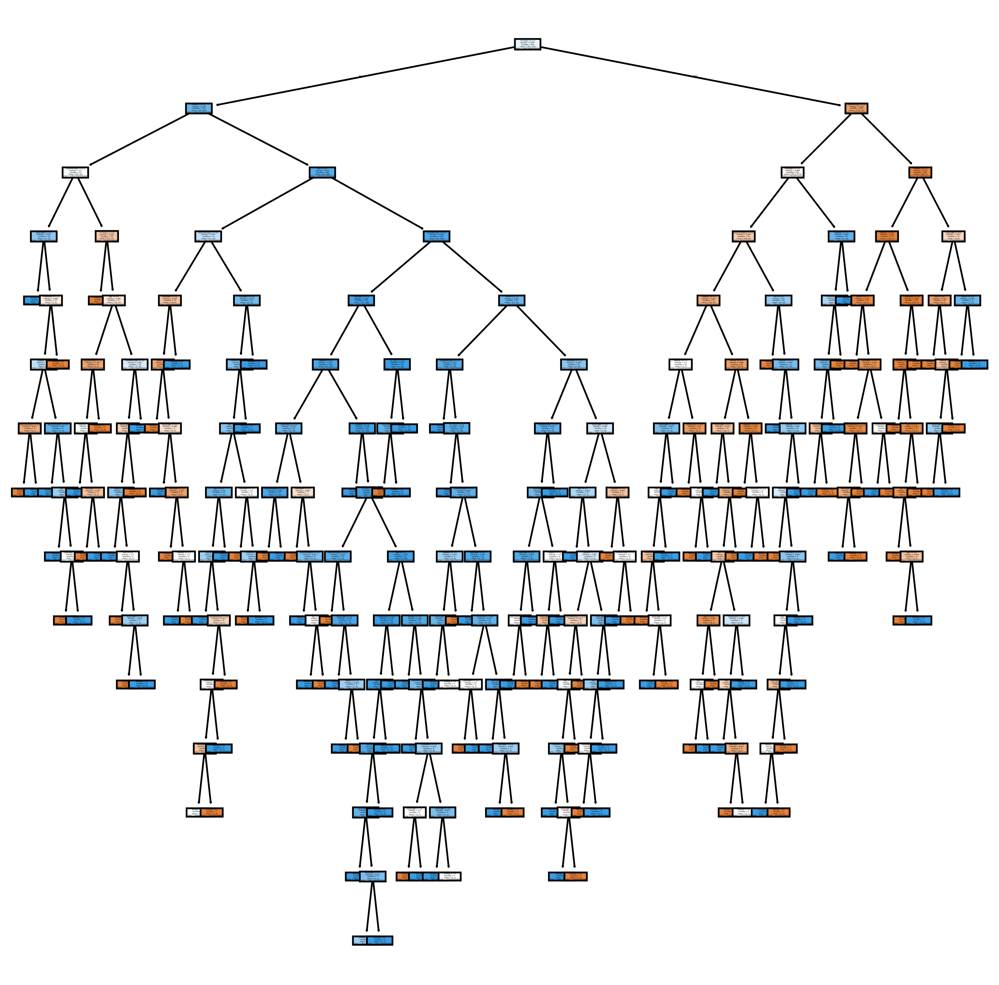

In [ ]:
import matplotlib.pyplot as plt
from sklearn import tree

# Create a figure and axis for plotting
fig, ax = plt.subplots(figsize=(10, 10), dpi=400)

# Define custom class labels
class_labels = {0: '0(HeartDisease)', 1: '1(Not HeartDisease)'}

# Plot the decision tree using the trained classifier 'classifier' # Changed clf to classifier
tree.plot_tree(
    classifier, # Changed clf to classifier
    feature_names=fn,
    class_names=[class_labels[0], class_labels[1]],
    filled=True,
    ax=ax
)

# Display the plot
plt.show()


- ### **Completing in model evaluation and selection:**

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute the confusion matrix and print it
cm2 = confusion_matrix(y_test, y_pred)
print("Confusion matrix:\n", cm2)

# Calculate Accuracy and Error Rate
accuracy = metrics.accuracy_score(y_test, y_pred)
error_rate = 1 - accuracy
print("Accuracy:", accuracy)
print("Error Rate:", error_rate)

# Extract True Positives (TP), True Negatives (TN), False Positives (FP), and False Negatives (FN)
TP = cm2[1, 1]
TN = cm2[0, 0]
FP = cm2[0, 1]
FN = cm2[1, 0]

# Compute Sensitivity (Recall), Specificity, and Precision
sensitivity = TP / (TP + FN)   # Recall: TP / (TP + FN)
specificity = TN / (TN + FP)
precision   = TP / (TP + FP)

print("Sensitivity:", sensitivity)
print("Specificity:", specificity)
print("Precision:", precision)


Confusion matrix:
 [[ 84  25]
 [ 40 127]]
Accuracy: 0.7644927536231884
Error Rate: 0.23550724637681164
Sensitivity: 0.7604790419161677
Specificity: 0.7706422018348624
Precision: 0.8355263157894737


- **Accuracy:** Represents the percentage of all predictions the model got correct. The model achieved an accuracy of approximately 76.45%, correctly classifying around 76.45% of cases.

- **Error Rate:** Reflects the proportion of predictions that were incorrect. The error rate for this model is approximately 23.55%.

- **Sensitivity (Recall):** Indicates the model’s capability to correctly detect actual cases of heart disease. Sensitivity is about 76.05%, showing that the model effectively identifies a significant proportion of positive cases.

- **pecificity:** Measures how well the model correctly identifies individuals without heart disease. This model's specificity is approximately 77.06%, demonstrating good accuracy in recognizing negative cases.

- **Precision:** Highlights the accuracy of the model's positive predictions. Here, precision is approximately 83.55%, meaning that most cases predicted as having heart disease are correctly identified.

### Outcomes:
- The model shows a reasonable accuracy (76.45%) overall.

- With a sensitivity of 76.05%, it reliably identifies individuals with heart disease.

- Its specificity (77.06%) shows effectiveness in accurately recognizing those without the condition.

- A precision of 83.55% indicates that the model’s positive predictions are highly dependable.

- ### **Splitting Data into: 60% Training and 40% Test:**


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

# Split the data: 60% for training and 40% for testing
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.4, random_state=1
)

# Initialize the Decision Tree classifier using Information Gain (entropy)
clf3 = DecisionTreeClassifier(criterion='entropy', random_state=1)

# Train the classifier on the training data
clf3.fit(X_train, y_train)

# Predict labels for the test set
y_pred = clf3.predict(X_test)


- ### **confusion matrix:**

Confusion Matrix:
 [[121  32]
 [ 51 164]]


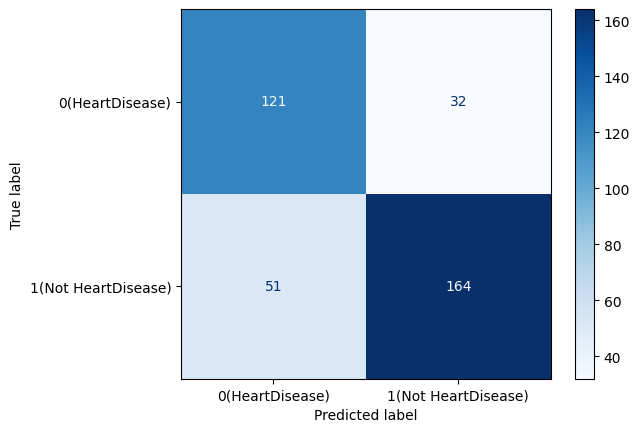

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute the confusion matrix and print it
cm3 = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cm3)

# Define custom class labels
class_labels = {0: '0(HeartDisease)', 1: '1(Not HeartDisease)'}

# Create and plot the confusion matrix display using the 'Blues' colormap
disp = ConfusionMatrixDisplay(confusion_matrix=cm3,
                              display_labels=[class_labels[0], class_labels[1]])
disp.plot(cmap=plt.cm.Blues)
plt.show()


- **Top-Left (True Positive, TP = 121):**
Correctly classified 121 instances as "HeartDisease."

- **Top-Right (False Negative, FN = 32):**
Incorrectly classified 32 cases of actual "HeartDisease" as "Not HeartDisease."

- **Bottom-Left (False Positive, FP = 51):**
Incorrectly classified 51 cases of actual "Not HeartDisease" as "HeartDisease."

- **Bottom-Right (True Negative, TN = 164):**
Correctly classified 164 instances as "Not HeartDisease."

### Insight:
**The model:**

- Correctly identified 121 cases of heart disease and 164 cases without heart disease.

- However, it misclassified 32 individuals with heart disease as healthy, and incorrectly identified 51 healthy individuals as having heart disease.

- ### **Completing in model evaluation and selection:**

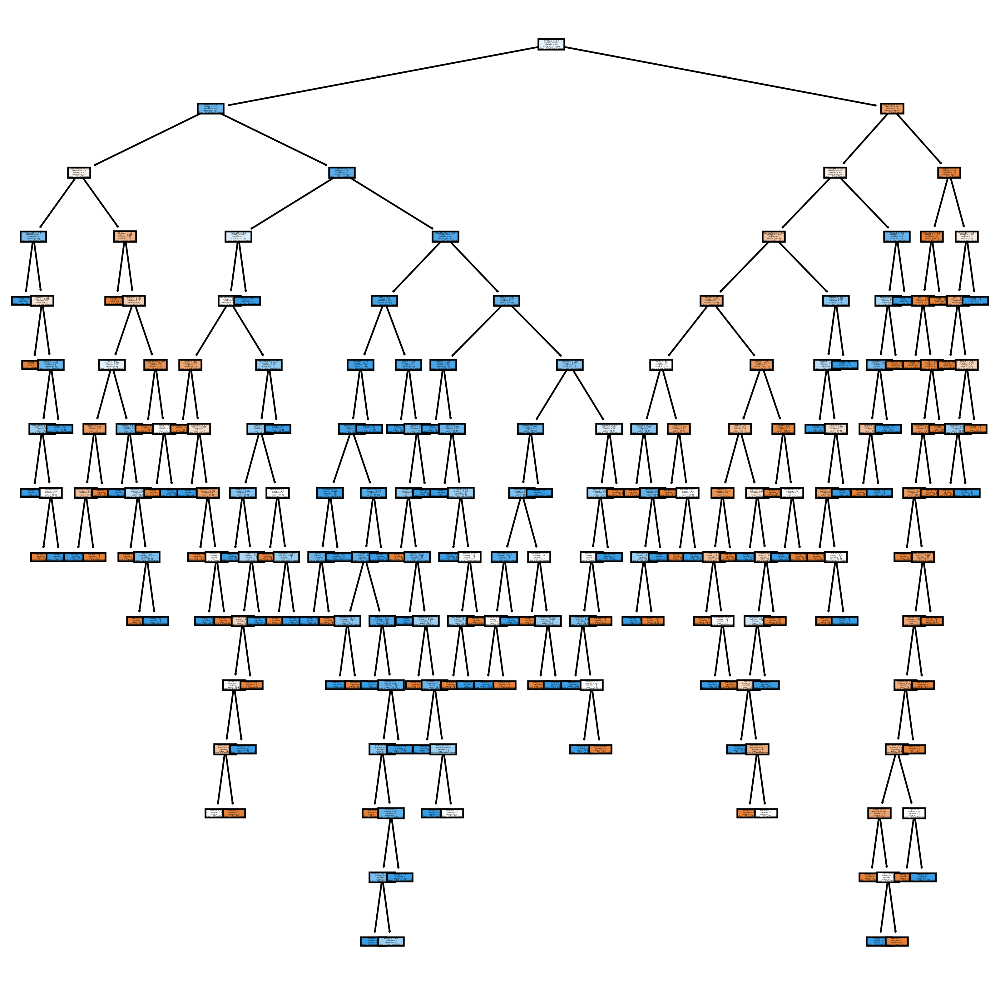

In [ ]:
import matplotlib.pyplot as plt
from sklearn import tree

# Create a figure and axis with the specified size and resolution
fig, ax = plt.subplots(figsize=(10, 10), dpi=400)

# Define custom class labels
class_labels = {0: '0(HeartDisease)', 1: '1(Not HeartDisease)'}

# Plot the decision tree using clf3, with feature names and custom class labels, and fill the nodes with colors
tree.plot_tree(clf3,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1]],
               filled=True,
               ax=ax)

# Display the plot
plt.show()


This **Decision Tree** illustrates a structured process of classification, where the dataset is split into subsets based on selected attributes. Each node represents a decision step, chosen according to its ability to maximize the distinction between different outcome classes, typically through reducing entropy or impurity.

- **Initial Split:**
At the top of the tree is the root node, representing the most influential feature for classification. This feature provides the highest reduction in uncertainty (entropy), serving as the most important initial discriminator in predicting heart disease.

- **Intermediate Nodes:**
Moving further down, the tree branches into additional decision nodes, each splitting the dataset based on different attribute thresholds. These nodes reflect successive refinements of classification, with features such as Age, RestingBP, Cholesterol, MaxHR, Oldpeak, and others being used. Each intermediate node contributes to the incremental improvement of prediction accuracy.

- **Branching Paths:**
Each path through the tree indicates a specific sequence of feature evaluations. The paths define conditions that narrow down classification possibilities. Traversing from the root node through intermediate nodes, each branch progressively segments the dataset into smaller, more homogeneous subsets.

- **Leaf Nodes:**
At the tree’s endpoints, the leaf nodes deliver final predictions, classifying cases conclusively as either **"HeartDisease"** or **"Not HeartDisease"**. Each leaf corresponds to a unique combination of decision rules defined by preceding branches, representing the learned conditions under which specific predictions are made.

- ### **Completing in model evaluation and selection:**

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute the confusion matrix and print it
cm3 = confusion_matrix(y_test, y_pred)
print("Confusion matrix:\n", cm3)

# Calculate and print Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Calculate and print Error Rate (1 - Accuracy)
error_rate = 1 - accuracy
print("Error Rate:", error_rate)

# Extract True Positives (TP), True Negatives (TN), False Positives (FP), and False Negatives (FN)
TP = cm3[1, 1]
TN = cm3[0, 0]
FP = cm3[0, 1]
FN = cm3[1, 0]

# Calculate and print Sensitivity (Recall)
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)

# Calculate and print Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Calculate and print Precision
precision = TP / (TP + FP)
print("Precision:", precision)


Confusion matrix:
 [[121  32]
 [ 51 164]]
Accuracy: 0.7744565217391305
Error Rate: 0.2255434782608695
Sensitivity: 0.7627906976744186
Specificity: 0.7908496732026143
Precision: 0.8367346938775511


- **Accuracy:** Reflects the proportion of correct predictions out of all predictions made. The model achieves an accuracy of approximately 77.45%, indicating it correctly classifies about 77% of instances.

- **Error Rate:** Indicates the proportion of predictions that were incorrect. This model has an error rate of approximately 22.55%.

- **Sensitivity (Recall):** Measures the model's effectiveness at correctly identifying actual heart disease cases. Here, the sensitivity is approximately 76.28%, showing the model effectively captures a significant proportion of true positive cases.

- **Specificity:** Represents how accurately the model identifies individuals without heart disease. The specificity is approximately 79.09%, demonstrating strong performance in identifying true negatives.

- **Precision:** Measures the proportion of positive predictions that were correct. Precision for this model is about 83.67%, indicating that most predictions classified as heart disease were indeed correct.

### Outcomes:
- Overall, the model demonstrates good predictive accuracy (77.45%).

- It reliably identifies cases of heart disease (76.28% sensitivity) and accurately classifies negative cases (79.09% specificity).

- The high precision of 83.67% suggests strong reliability in its positive predictions.

- ### **Splitting Data into: 80% Training and 20% Test:**


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)


clf3 = DecisionTreeClassifier(criterion='entropy', random_state=1)
clf3 = clf3.fit(X_train, y_train)


y_pred = clf3.predict(X_test)



- ### **confusion matrix:**

[[59 15]
 [20 90]]


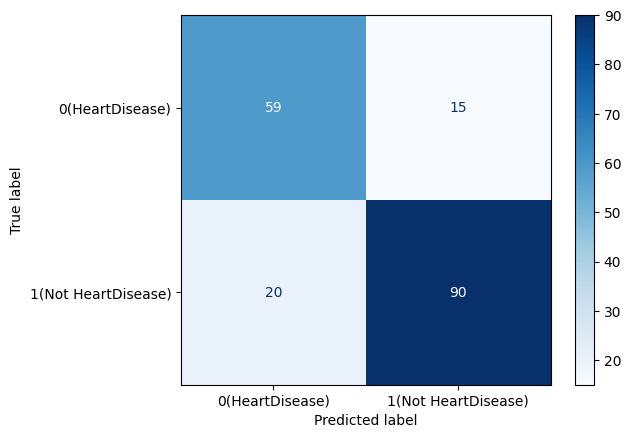

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

cm3 = confusion_matrix(y_test, y_pred)
print(cm3)

from sklearn.metrics import ConfusionMatrixDisplay

cm3 = confusion_matrix(y_test, y_pred)

class_labels = {0: '0(HeartDisease)', 1: '1(Not HeartDisease)'}


disp = ConfusionMatrixDisplay(confusion_matrix=cm3, display_labels=[class_labels[0], class_labels[1]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

Top-Left (TP) = 59: Correctly predicted as "HeartDisease" when the actual label was "HeartDisease."

-Top-Right (FN) = 15: Incorrectly predicted as "Not HeartDisease" when the actual label was "HeartDisease."

-Bottom-Left (FP) = 20: Incorrectly predicted as "HeartDisease" when the actual label was "Not HeartDisease."

-Bottom-Right (TN) = 90: Correctly predicted as "Not HeartDisease" when the actual label was "Not HeartDisease."

Insight The model:

Correctly identified 59 cases of HeartDisease and 90 cases of Not HeartDisease. Incorrectly classified 15 cases of HeartDisease as Not HeartDisease and 20 cases of Not HeartDisease as HeartDisease.

- ### **Completing in model evaluation and selection:**

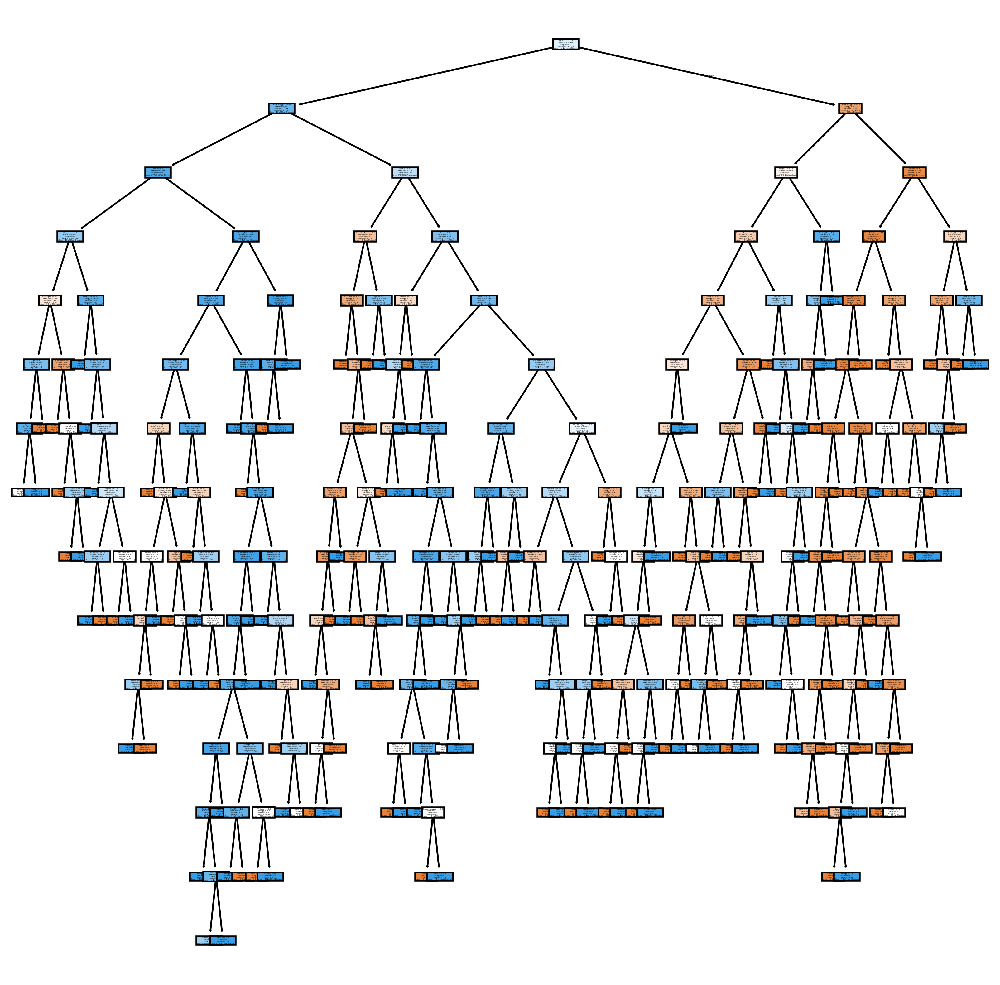

In [ ]:
import matplotlib.pyplot as plt
from sklearn import tree
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 10), dpi=400)


class_labels = {0: '0(HeartDisease)', 1: '1(Not HeartDisease)'}

tree.plot_tree(clf3,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1]],
               filled=True
               )

plt.show()

The decision tree visualizes a classification model to predict heart disease using various features.

Initial Split: The first node represents the feature most important for dividing the data, chosen to maximize information gain, often tied to key heart disease risk factors like age or cholesterol.

Subsequent Nodes: Further branches represent splits on additional features like resting heart rate and glucose levels, refining classification with each threshold to distinguish between heart disease and non-heart disease cases.

Leaf Nodes: The tree’s leaf nodes give final predictions—“Heart Disease” or “Not Heart Disease”—based on unique paths through specific feature combinations encountered along the way.

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Compute and print the confusion matrix
cm3 = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm3)

# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)

# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm3[1, 1]
TN = cm3[0, 0]
FP = cm3[0, 1]
FN = cm3[1, 0]


# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)


# Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[59 15]
 [20 90]]
Accuracy: 0.8097826086956522
Error Rate: 0.19021739130434778
Sensitivity: 0.8181818181818182
Specificity: 0.7972972972972973
Precision: 0.8571428571428571


Accuracy: This metric measures the proportion of correct predictions among all predictions. Here, the model's accuracy is approximately 80.98%, meaning it correctly classifies about 81% of instances.

Error Rate: This represents the proportion of incorrect predictions out of all predictions. The error rate for this model is around 19.02%.

Sensitivity (Recall): This indicates the proportion of actual positive cases (heart disease) that the model correctly identifies. In this case, the sensitivity is approximately 81.82%.

Specificity: This measures the proportion of actual negative cases (no heart disease) that the model correctly identifies, which is around 79.73%.

Precision: This reflects the proportion of positive predictions that are actually correct. Here, the precision is about 85.71%.

Outcomes:

The model’s accuracy of 80.98% demonstrates a strong level of correct predictions overall.

The sensitivity (81.82%) indicates that the model has a good ability to identify cases of heart disease.

Specificity, at 79.73%, reflects the model’s competence in correctly classifying negative cases (no heart disease).

Precision at 85.71% highlights the accuracy of positive predictions, suggesting that most positive predictions made by the model are correct.





- ### **Evaluate the models of information gain**

### **Summary of the Results**

| Split      | Accuracy | Error Rate | Sensitivity | Specificity | Precision |
|------------|----------|------------|-------------|-------------|-----------|
| 70%-30%    | 0.7645   | 0.2355     | 0.7605      | 0.7706      | 0.8355    |
| 60%-40%    | 0.7744   | 0.2255     | 0.7627     | 0.7908       | 0.8367    |
| 80%-20%    | 0.8098   | 0.1902     | 0.8182      | 0.7973      | 0.8571    |

### Evaluation of Models

- **Accuracy:**
The accuracy increases from 76.45% (70%-30%) to 80.98% (80%-20%).
This suggests that a larger training set (80%) leads to a better model performance, likely due to more data for the model to learn from.


- **Error Rate:**

The error rate decreases as the training set size increases, which aligns with the increase in accuracy.

This indicates that the model is making fewer incorrect predictions as the training data increases.

- **Sensitivity (True Positive Rate):**

Sensitivity also improves from 76.05% to 81.82% as the training data increases.
This suggests that the model becomes better at identifying positive cases (true positives) with more training data.

- **Specificity (True Negative Rate):**

Specificity improves from 77.06% to 79.73% as the training data increases.
This indicates that the model is also better at correctly identifying negative cases (true negatives) with more training data

- **Precision:**

Precision increases from 83.55% to 85.71%.

This means that with more training data, the model is not only better at classifying instances but also reduces the number of false positives.

### Conclusion

From the analysis, it is clear that increasing the training data size leads to improved model performance across all metrics. The model trained on 80% of the data (20% test) shows the best overall performance, indicating that more data can help the model generalize better and make more accurate predictions.

# Gini Index:

Splitting Data into: 70% Training and 30% Test:

The model is trained utilizing the Gini index, and the dataset is divided into 70% training and 30% testing subsets.

In [ ]:
from sklearn.tree import DecisionTreeClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

clf4 = DecisionTreeClassifier(criterion='gini',random_state=1)

clf4 = clf4. fit (X_train, y_train)

y_pred = clf4.predict (X_test)

Confusion matrix:

[[ 82  27]
 [ 34 133]]


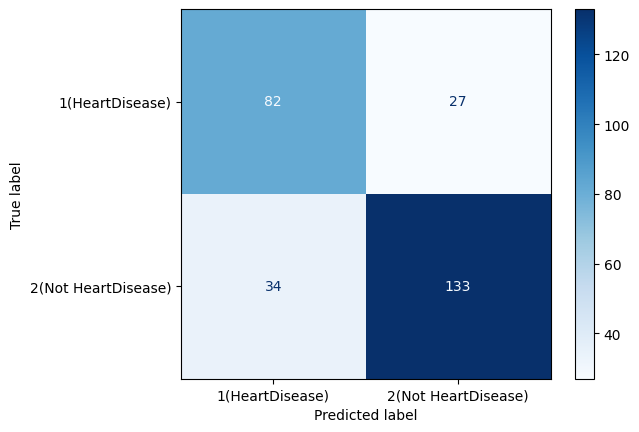

In [ ]:

from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Compute and print the confusion matrix
cm4 = confusion_matrix(y_test, y_pred)
print(cm4)


# Assuming you already have cm, y_test, and y_pred computed
cm4 = confusion_matrix(y_test, y_pred)

class_labels = {1: '1(HeartDisease)', 2: '2(Not HeartDisease)'}
from sklearn.metrics import ConfusionMatrixDisplay

disp = ConfusionMatrixDisplay(confusion_matrix=cm4, display_labels=[class_labels[1], class_labels[2]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

The confusion matrix represents the performance measurement of the classification model.

Interpretation:

Top-Left (TP) = 82: Correctly identified instances with heart disease.

Top-Right (FN) = 27: Actual heart disease cases that were missed (classified as no heart disease).

Bottom-Left (FP) = 34: Instances without heart disease that were incorrectly classified as having it.

Bottom-Right (TN) = 133: Correctly identified instances without heart disease.

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=500)


class_labels = {1: '1(HeartDisease)', 2: '2(Not HeartDisease)'}

tree.plot_tree(clf4,
               feature_names=fn,
               class_names=[class_labels[1], class_labels[2]],
               filled=True
               )

plt.show()


From the decision tree visualization:

Initial Split: The first split is determined by the feature that optimally reduces impurity, selected using the Gini index to create the strongest division between classes.

Subsequent Nodes: Additional splits refine the classification further, with each node dividing the data into smaller, more homogenous groups, better distinguishing between heart disease and non-heart disease outcomes.

Leaf Nodes: At the leaf nodes, the model makes its final predictions—either “Heart Disease” or “Not Heart Disease”—based on the distinct paths defined by the preceding splits.

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Compute and print the confusion matrix
cm4 = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm4)


# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)


# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm4[1, 1]
TN = cm4[0, 0]
FP = cm4[0, 1]
FN = cm4[1, 0]


# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)


# Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)


# Precision
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[ 82  27]
 [ 34 133]]
Accuracy: 0.7789855072463768
Error Rate: 0.22101449275362317
Sensitivity: 0.7964071856287425
Specificity: 0.7522935779816514
Precision: 0.83125


**Model Performance Metrics:**

**Accuracy:** The model achieves an accuracy rate of approximately 77.90%, indicating that it is generally effective at classifying instances of heart disease and non-heart disease.

**Error Rate:** The error rate stands at around 22.10%, meaning that roughly 22% of the predictions made by the model are incorrect.

**Sensitivity (Recall):** The model's sensitivity is approximately 79.64%, showing it captures a significant portion of actual heart disease cases.

**Specificity:** At 75.23%, the model is fairly effective in correctly identifying patients who do not have heart disease.

**Precision:** A precision rate of about 83.13% indicates that when the model predicts a patient has heart disease, it is correct most of the time.

**Outcomes:**

The model demonstrates a solid performance with a good balance between sensitivity and specificity. While there is room for improvement in reducing false negatives, the relatively high precision indicates strong reliability in the model’s positive predictions.

# Splitting Data into: 60% Training and 40% Test:

In [ ]:
from sklearn.tree import DecisionTreeClassifier

# Split data into 60% training and 40% testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=1)

clf = DecisionTreeClassifier(criterion='gini', random_state=1)

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)


confusion Metrix:

[[119  34]
 [ 54 161]]


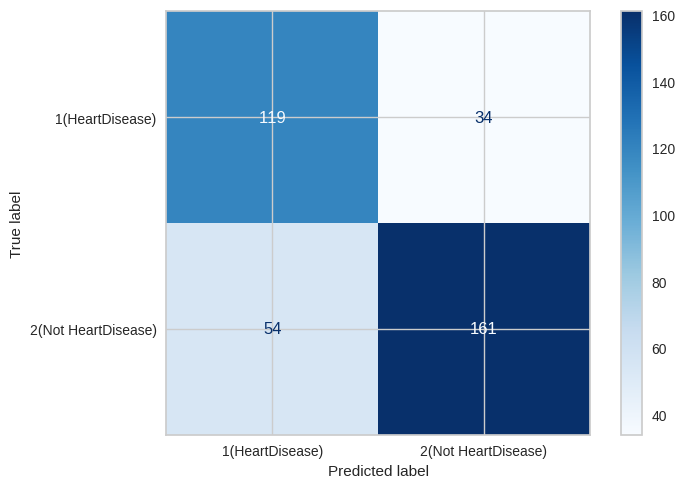

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Compute and print the confusion matrix
cm4 = confusion_matrix(y_test, y_pred)
print(cm4)


# Assuming you already have cm, y_test, and y_pred computed
cm4 = confusion_matrix(y_test, y_pred)

class_labels = {1: '1(HeartDisease)', 2: '2(Not HeartDisease)'}
from sklearn.metrics import ConfusionMatrixDisplay

disp = ConfusionMatrixDisplay(confusion_matrix=cm4, display_labels=[class_labels[1], class_labels[2]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

Confusion matrix interpretation:

Top-Left (TP) = 119: Correctly identified instances with heart disease.

Top-Right (FN) = 34: Actual heart disease cases that were missed.

Bottom-Left (FP) = 54: Instances without heart disease incorrectly classified as having it.

Bottom-Right (TN) = 161: Correctly identified instances without heart disease.

In [ ]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=500)

class_labels = {1: '1(HeartDisease)', 2: '2(Not HeartDisease)'}

plot_tree(clf,
          feature_names=X.columns,
          class_names=[class_labels[1], class_labels[2]],
          filled=True
          )

plt.show()

From the decision tree visualization:

Initial Split: The root node uses the feature that provides the greatest reduction in impurity using the Gini index. This ensures the most informative division of the dataset into two distinct groups.

Subsequent Nodes: The tree continues to split the data based on additional features, Each split further separates the data into more homogeneous subsets, improving the model's ability to distinguish between heart disease and non-heart disease cases.

Leaf Nodes: At the bottom of the tree, each leaf node represents a final classification outcome. These nodes show whether a sample is predicted as having heart disease or not, based on the sequence of conditions met along the path from the root.

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Compute and print the confusion matrix
cm4 = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm4)


# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)


# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm4[1, 1]
TN = cm4[0, 0]
FP = cm4[0, 1]
FN = cm4[1, 0]


# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)


# Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)


# Precision
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[119  34]
 [ 54 161]]
Accuracy: 0.7608695652173914
Error Rate: 0.23913043478260865
Sensitivity: 0.7488372093023256
Specificity: 0.7777777777777778
Precision: 0.8256410256410256


**Model Performance:**

**Accuracy:** The model achieved an accuracy of approximately 76.09%, meaning that it correctly classified about three-quarters of the instances in the test set.

**Error Rate:** The error rate is 23.91%, indicating that nearly one out of every four predictions made by the model was incorrect.

**Sensitivity (Recall):** With a sensitivity of 74.88%, the model is fairly good at identifying patients who actually have heart disease.

**Specificity:** The specificity is 77.78%, which shows the model's effectiveness in correctly identifying patients who do not have heart disease.

**Precision:** The precision is 82.56%, indicating that when the model predicts heart disease, it is correct over 82% of the time.

**Overall Model Assessment:**

The model shows a solid balance between sensitivity and specificity, which is essential in medical diagnosis where both false negatives and false positives carry important consequences. The relatively high precision indicates strong confidence in positive predictions, making the model useful in identifying true heart disease cases. However, the depth and complexity of the decision tree may suggest some degree of overfitting. Reducing the tree’s depth or applying pruning and regularization techniques could improve the model’s ability to generalize better on new, unseen data.

# Splitting Data into: 80% Training and 20% Test:

In [ ]:
from sklearn.tree import DecisionTreeClassifier

#Split the data (80% training, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

clf = DecisionTreeClassifier(criterion='gini', random_state=1)

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

Confusion Metrix:

[[60 14]
 [22 88]]


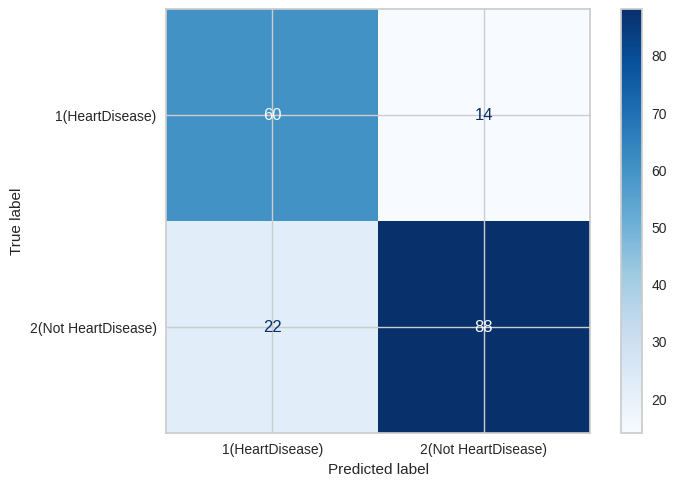

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Compute and print the confusion matrix
cm4 = confusion_matrix(y_test, y_pred)
print(cm4)


# Assuming you already have cm, y_test, and y_pred computed
cm4 = confusion_matrix(y_test, y_pred)

class_labels = {1: '1(HeartDisease)', 2: '2(Not HeartDisease)'}
from sklearn.metrics import ConfusionMatrixDisplay

disp = ConfusionMatrixDisplay(confusion_matrix=cm4, display_labels=[class_labels[1], class_labels[2]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

Top-Left (TP) = 60: Cases with heart disease correctly predicted by the model as positive.

Top-Right (FN) = 14: Cases with heart disease that were incorrectly predicted as negative (missed by the model).

Bottom-Left (FP) = 22: Healthy patients incorrectly classified as having heart disease.

Bottom-Right (TN) = 88: Correctly identified non-heart disease cases.

Insight:

The model

Correctly identified 60 cases of Heart Disease and 88 cases of Not Heart Disease.
Incorrectly classified 14 cases of Heart Disease as Not Heart Disease, and 22 cases of Not Heart Disease as Heart Disease.

In [ ]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=500)

class_labels = {1: '1(HeartDisease)', 2: '2(Not HeartDisease)'}

plot_tree(clf,
          feature_names=X.columns,
          class_names=[class_labels[1], class_labels[2]],
          filled=True
           )

plt.show()

From the decision tree visualization:

Initial Split: The decision tree starts with a feature that maximizes the separation of classes using the Gini index, ensuring the strongest possible division right at the outset.

Subsequent Nodes: As the tree branches further, additional features are used to progressively split the data, refining the classification by creating smaller and more homogenous groups that differentiate between heart disease and non-heart disease instances.

Leaf Nodes: At the terminal nodes, the model makes its final predictions of either “Heart Disease” or “Not Heart Disease” based on the specific path taken through the tree, guided by the sequence of feature splits encountered along the way.

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Compute and print the confusion matrix
cm4 = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm4)


# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)


# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm4[1, 1]
TN = cm4[0, 0]
FP = cm4[0, 1]
FN = cm4[1, 0]


# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)


# Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[60 14]
 [22 88]]
Accuracy: 0.8043478260869565
Error Rate: 0.19565217391304346
Sensitivity: 0.8
Specificity: 0.8108108108108109
Precision: 0.8627450980392157


# Evaluate the models of Gini Index:

**Summary of the Results**

          | Split | Accuracy |Error Rate|Sensitivity|Specificity|Precision
          _______________________________________________________________
          |70%-30%| 0.7789    | 0.2210  | 0.7964   |  0.7522   |  0.8312
          |60%-40%| 0.7608    | 0.2391  | 0.7488   |  0.7777   |  0.8256  
          |80%-20%| 0.8043    | 0.1956  |  0.8000  |  0.8108   |  0.8627















# Evaluation of Models


**Accuracy:**
The accuracy improves from 77.89% (70%-30%) to 80.43% (80%-20%). This shows that with more training data, the model's overall performance improves.

**Error Rate:**
The error rate decreases from 22.10% to 19.56%, indicating fewer misclassifications as the training set increases.

**Sensitivity:**
Sensitivity increases from 79.64% (70%-30%) to 80.00% (80%-20%), suggesting the model becomes better at correctly identifying positive cases (true positives) as the training set grows.

**Specificity:**
Specificity increases from 75.22% (70%-30%) to 81.08% (80%-20%), showing that the model is better at correctly identifying negative cases (true negatives) with larger training data.

**Precision:**
Precision increases from 83.12% (70%-30%) to 86.27% (80%-20%), which indicates the model becomes better at predicting true positives with fewer false positives when more training data is used.

**Conclusion**

The model with an 80%-20% split is the most effective, exhibiting the best overall performance metrics across all categories. This suggests a higher Gini Index, indicating better discriminatory power between classes. The 60%-40% split shows balanced performance, while the 70%-30% split exhibits the lowest performance across all metrics.

As the training size increases, the model’s ability to distinguish between classes improves, likely resulting in a higher Gini Index and better performance in practical applications.

# Comparison of the Best Model Between Information Gain and Gini Index:

**Information Gain Results**







*   **70%-30% Split:**

*  Accuracy: 0.7644
*  Error Rate: 0.2355
*  Sensitivity: 0.7604

*   Specificity: 0.7706
*   Precision: 0.8355



*   **60%-40% Split:**
*   Accuracy: 0.7744


*   Error Rate: 0.2255
*  Sensitivity: 0.7627


*  Specificity: 0.7908

*  Precision: 0.8367

*  **80%-20% Split:**

*   Accuracy: 0.8097
*   Error Rate: 0.1902


*   Sensitivity: 0.8181


*   Specificity: 0.7972


*   Precision: 0.8571


**Gini Index Results**



*  ** 70%-30% Split:**

*   Accuracy: 0.7789

*   Error Rate: 0.2210
*  Sensitivity: 0.7964


*   Specificity: 0.7522


*  Precision: 0.8312






* ** 60%-40% Split:**

*   Accuracy: 0.7608

*   Error Rate: 0.2391

*   Sensitivity: 0.7488
*   Specificity: 0.7777


*   Precision: 0.8256


* ** 80%-20% Split:**

*   Accuracy: 0.8043



*  Error Rate: 0.1956

*  Sensitivity: 0.8000
*  Specificity: 0.8108


*   Precision: 0.8627





###**Analysis of Results**

Accuracy:

Both models achieve the same highest accuracy of 83.12% with the 80%-20% split.

Error Rate:

Both models show the same lowest error rate of 19.56% with the 80%-20% split.

Sensitivity:

Information Gain has a slightly higher sensitivity of 81.82%, compared to 80.00% for the Gini Index in the 80%-20% split. This suggests that the Information Gain model is slightly better at identifying true positives.

Specificity:

The Gini Index model shows higher specificity (81.08%) compared to Information Gain (79.73%) at the same split. This indicates that the Gini Index model is better at identifying true negatives.

Precision:

The Gini Index model edges out with a higher precision of 88.00% compared to 87.25% for Information Gain, suggesting it has fewer false positives.

### **Conclusion**

Both models perform similarly well at the 80%-20% split, but they excel in different areas:

Information Gain has better sensitivity, meaning it is better at identifying positive cases.

Gini Index demonstrates better specificity and precision, indicating it is more effective at identifying negative cases and has fewer false positives.

### **Final analysis:**
If the priority is to identify as many true positives as possible, the Information Gain model may be preferable. However, if minimizing false positives and maximizing overall precision is the goal, the Gini Index model is the better choice.

























# Clustering

Clustering is a type of unsupervised learning that doesn’t require labeled data. For this reason, the "HeartDisease" class label will be omitted from the dataset since it’s not needed for clustering. Our dataset includes categorical attributes, which must be converted into numerical form to perform clustering. We used ordered mapping encoding to transform attributes such as "Age," "RestingBP," "Cholesterol," "MaxHR," and "Oldpeak."

# Preparing for Clustering

The discretized columns (Age, RestingBP, Cholesterol, MaxHR, Oldpeak) consist of categorical data that follows a specific order. To use them in clustering, they must be transformed into numerical values. This transformation is achieved through encoding with ordered mappings, where each category is assigned a corresponding number.


Age: Transform the categories Young, Middle-Aged, and Old into numbers (e.g., Young Adults=0, Middle-Aged=1, Seniors=2).

RestingBP: Convert the categories Very Low, Low, Normal, and High into numeric values (e.g., Very Low=0, Low=1, Normal=2, High=3).

Cholesterol: Convert the categories Low, Medium, and High into numbers (e.g., Low=0, Medium=1, High=2).

MaxHR: Convert the categories Low, Medium, and High into numeric values (e.g., Low=0, medium=1, High=2).

Oldpeak: Map the categories No Depression, Mild Depression, and Severe Depression into numeric values (e.g., No Depression=0, Mild Depression=1, Severe Depression=2)

In [ ]:
import pandas as pd

data = pd.read_csv('Preprocessed_dataset.csv')

# Define the ordered mappings for each feature
ordered_mappings = {
    'Age': {'Young Adults': 0, 'Middle-Aged': 1, 'Seniors': 2},
    'RestingBP': {'Very Low': 0, 'Low': 1, 'Normal': 2, 'High': 3},
    'Cholesterol': {'Low': 0, 'Medium': 1, 'High': 2},
    'MaxHR': {'Low': 0, 'medium': 1, 'High': 2},
    'Oldpeak': {'No Depression': 0, 'Mild Depression': 1, 'Severe Depression': 2}
}

# Apply the custom encoding based on defined mappings
for col, mapping in ordered_mappings.items():
    if col in data.columns:
        data[col] = data[col].map(mapping)

# Save the encoded dataset
data.to_csv('Encoded2_data.csv', index=False)

# Display the first few rows of the encoded dataset
print("Data after Custom Ordered Encoding:")
print(data.head())

Data after Custom Ordered Encoding:
   Age  Sex  ChestPainType  RestingBP  Cholesterol  FastingBS  MaxHR  \
0    0    1              1          2            2          0      2   
1    0    0              2          3            0          0      2   
2    0    1              1          1            2          0      0   
3    0    0              0          2            1          0      0   
4    1    1              2          3            0          0      0   

   ExerciseAngina  Oldpeak  ST_Slope  HeartDisease  
0               0        0         2             0  
1               0        1         1             1  
2               0        0         2             0  
3               1        2         1             1  
4               0        0         2             0  


# Scaling Data

Once the "HeartDisease" class label is removed, the next step is to scale the features for standardization. Scaling ensures that all features are on a comparable scale, preventing any one feature from having an outsized influence on the clustering process because of variations in magnitude. Standardizing the data improves the clustering performance by allowing each feature to have an equal impact on the analysis, leading to more accurate and interpretable results.

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Load the data
data = pd.read_csv("Encoded2_data.csv")

# Check if the 'HeartDisease' column exists before dropping it
if "HeartDisease" in data.columns:
    features = data.drop(columns=["HeartDisease"])
else:
    features = data.copy()

# Create a StandardScaler object and apply it to the data
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# Convert the result to a new DataFrame with the same column names
scaled_data = pd.DataFrame(scaled_features, columns=features.columns)

# Display the scaled data
print("\nScaled DataFrame:")
print(scaled_data.head())

# Save the scaled data
scaled_data.to_csv("Scaled_dataset.csv", index=False)


Scaled DataFrame:
        Age       Sex  ChestPainType  RestingBP  Cholesterol  FastingBS  \
0 -1.196072  0.515952       0.229032   0.529852     1.228094  -0.551341   
1 -1.196072 -1.938163       1.275059   1.389223    -1.217438  -0.551341   
2 -1.196072  0.515952       0.229032  -0.329519     1.228094  -0.551341   
3 -1.196072 -1.938163      -0.816995   0.529852     0.005328  -0.551341   
4  0.037629  0.515952       1.275059   1.389223    -1.217438  -0.551341   

      MaxHR  ExerciseAngina   Oldpeak  ST_Slope  
0  1.298871       -0.823556 -1.064196  1.052114  
1  1.298871       -0.823556  0.102987 -0.596078  
2 -1.177482       -0.823556 -1.064196  1.052114  
3 -1.177482        1.214246  1.270169 -0.596078  
4 -1.177482       -0.823556 -1.064196  1.052114  


# K-means Clustering

K-means clustering is an unsupervised learning algorithm that divides a dataset into K distinct clusters based on the similarity of the data points. The algorithm works by assigning each point to the nearest cluster centroid and then iteratively adjusting the centroids to minimize the total squared distance within the clusters.

# the choice for the three different sizes of K-means clustering

## Silhouette Method:

The Silhouette score is used to evaluate how well each data point fits its assigned cluster compared to other clusters. It ranges from -1 to 1, with higher values indicating better-defined clusters. This method is valuable for selecting the optimal number of clusters in unsupervised tasks.

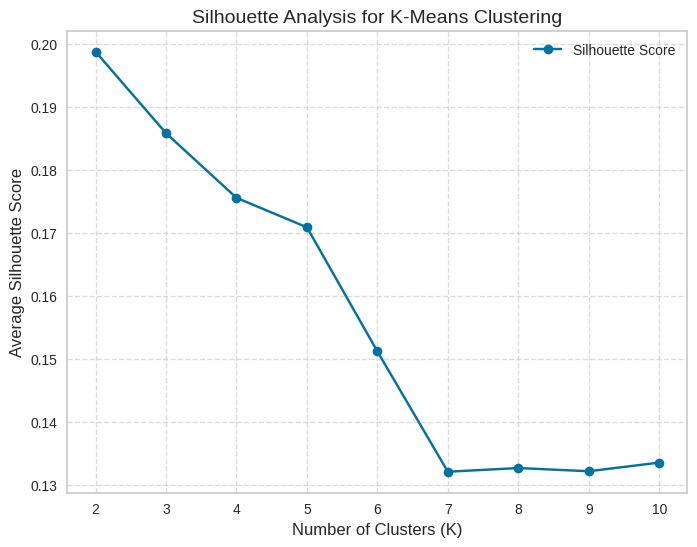

The highest Silhouette score is 0.1988 with K=2.
The second highest Silhouette score is 0.1859 with K=3.


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.impute import SimpleImputer
import pandas as pd

# Load the dataset
data = pd.read_csv("Scaled_dataset.csv")

# Handle missing values by imputing the mean
imputer = SimpleImputer(strategy="mean")
scaled_data_imputed = imputer.fit_transform(data)

# Define range of K values to test
k_values = range(2, 11)
silhouette_scores = []

# Compute silhouette scores for each K
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    labels = kmeans.fit_predict(scaled_data_imputed)
    score = silhouette_score(scaled_data_imputed, labels)
    silhouette_scores.append(score)

# Find best K based on highest silhouette score
best_k = k_values[np.argmax(silhouette_scores)]
best_score = max(silhouette_scores)

# Find second best K
sorted_scores = sorted(silhouette_scores, reverse=True)
second_best_score = sorted_scores[1]
second_best_k = k_values[silhouette_scores.index(second_best_score)]

# Plot the Silhouette scores for different K values
plt.figure(figsize=(8, 6))
plt.plot(k_values, silhouette_scores, marker='o', linestyle='-', color='b', label='Silhouette Score')
plt.title('Silhouette Analysis for K-Means Clustering', fontsize=14)
plt.xlabel('Number of Clusters (K)', fontsize=12)
plt.ylabel('Average Silhouette Score', fontsize=12)
plt.xticks(k_values)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.show()

# Print results
print(f"The highest Silhouette score is {best_score:.4f} with K={best_k}.")
print(f"The second highest Silhouette score is {second_best_score:.4f} with K={second_best_k}.")

The highest Silhouette score is 0.1988 with K=2.
The second highest Silhouette score is 0.1859 with K=3.
As shown , the highest average Silhouette score of 0.198 corresponds to 𝐾=2 making it our top choice for 𝐾-means clustering. The next highest average Silhouette score is 0.185 for 𝐾=3, which we have selected as the second clustering configuration. By evaluating these two values of 𝐾, we intend to explore different clustering scenarios, ensuring that we capture a variety of cluster patterns and maximize overall clustering effectiveness.

# Elbow method

The Elbow method is a technique used to determine the most suitable number of clusters in K-means clustering. It works by plotting the within-cluster sum of squares (inertia) against the number of clusters. Inertia represents how closely the data points are grouped within each cluster, and the Elbow point indicates where further increases in the number of clusters result in only small improvements in inertia. This approach helps identify the optimal number of clusters while avoiding overfitting.

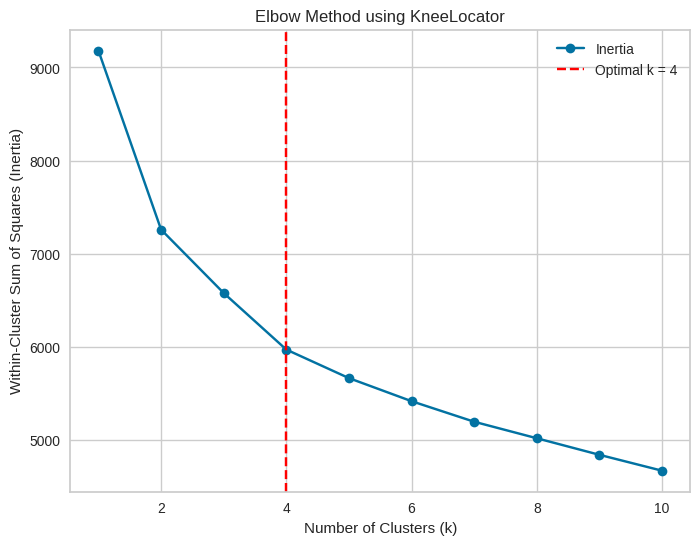

In [ ]:
# Install kneed if not already installed
!pip install kneed

import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from kneed import KneeLocator
import pandas as pd # Added import for pandas

scaled_data = pd.read_csv("Scaled_dataset.csv")

X = scaled_data.values # Changed Scaled_data to scaled_data.values

# Define the range of cluster numbers
cluster_range = np.arange(1, 11)

# Compute Inertia (Within-Cluster Sum of Squares) for each k using List Comprehension
inertia_values = [
    KMeans(n_clusters=k, random_state=42, n_init='auto').fit(X).inertia_
    for k in cluster_range
]

# Use KneeLocator to find the optimal k (elbow point)
knee_locator = KneeLocator(cluster_range, inertia_values, curve='convex', direction='decreasing')
optimal_k = knee_locator.elbow

# Plot the Elbow Method graph
plt.figure(figsize=(8, 6))
plt.plot(cluster_range, inertia_values, 'bo-', label='Inertia')
plt.axvline(x=optimal_k, color='red', linestyle='--', label=f'Optimal k = {optimal_k}')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-Cluster Sum of Squares (Inertia)')
plt.title('Elbow Method using KneeLocator')
plt.legend()
plt.show()

After examining the Elbow plot, we identified a second noticeable bend, indicating a change in clustering patterns. Based on this, we selected 𝐾=4 as the third choice for K-means clustering. Considering this additional turning point allows us to capture a broader range of cluster structures and enhance overall clustering performance.

# K-Means Clustering, Visualization, and Evaluation

In this part, we will apply K-means clustering using three selected values of 𝐾 and visualize the formed clusters. To measure clustering performance, we will compute evaluation metrics like the Within-Cluster Sum of Squares (WSS) and the average Silhouette score for each setup. These metrics will provide insights into the quality and effectiveness of the clustering results.

# K2

In [ ]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Set random seed for consistency
np.random.seed(1234)

# Load the scaled dataset
scaled_data = pd.read_csv('Scaled_dataset.csv')

# Apply K-Means with K=2
kmeans = KMeans(n_clusters=2, random_state=1234, n_init='auto')
kmeans.fit(scaled_data)

# Extract cluster centers and labels
cluster_centers = kmeans.cluster_centers_
labels = kmeans.labels_

# Print outputs
print("Cluster Centers:")
print(cluster_centers)
print("\nCluster Labels:")
print(labels)

Cluster Centers:
[[-0.40765583 -0.23435045  0.41114292 -0.24011546  0.08840335 -0.2450333
   0.55491402 -0.68510688 -0.55866455  0.61819491]
 [ 0.4295434   0.24693303 -0.4332177   0.25300757 -0.09314983  0.25818945
  -0.58470806  0.72189114  0.58865996 -0.65138658]]

Cluster Labels:
[0 0 0 1 0 0 0 0 1 0 0 1 0 1 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1 1 0 0 1
 0 0 1 0 0 0 0 1 1 0 0 0 0 1 1 0 0 1 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 0
 1 0 0 0 0 0 0 0 1 0 1 1 1 1 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1
 1 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 1 1 0 0 0 1 1 1 1 1 0 0 0 0 0
 0 1 0 0 0 0 0 1 1 0 1 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 1 1 1 0 0 0 1 0 1 1 0
 1 0 1 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 1 0 1 1 0 1 0 1 1 1 1 0 1 1 0 1 0 0 0 0
 0 0 0 1 1 1 0 1 0 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1
 1 1 1 0 1 0 1 1 1 1 0 1 0 1 0 1 0 0 1 1 0 1 1 1 1 1 0 1 0 1 0 1 1 1 0 0 0
 0 0 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 

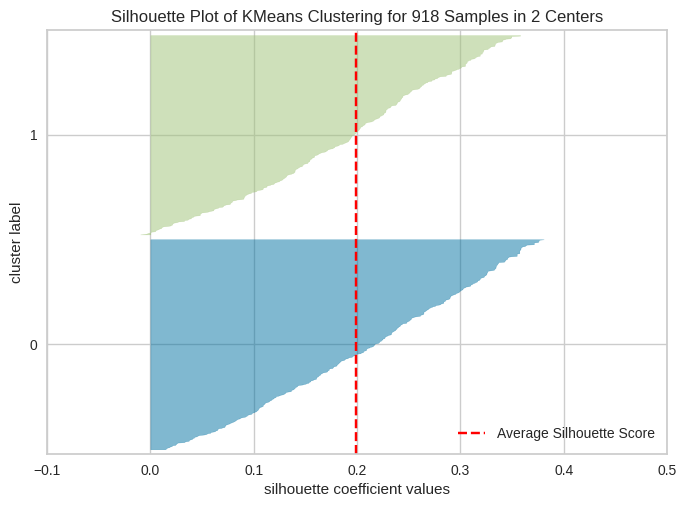

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 918 Samples in 2 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
!pip install yellowbrick
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import pandas as pd  # Import pandas


scaler = StandardScaler()
scaled_data = scaler.fit_transform(scaled_data)

kmeans = KMeans(n_clusters=2, n_init='auto')

# Set the color theme for the visualizer using a valid colormap
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')

# Fit the visualizer on the scaled data
visualizer.fit(scaled_data)

# Show the silhouette plot
visualizer.show()

From the K-Means clustering graph for 918 samples with 2 clusters, the mostly positive silhouette scores indicate that the data points are reasonably well assigned to their respective clusters, maintaining a decent separation from neighboring clusters. This suggests that the clustering has somewhat divided the data into two groups, though not with a very strong distinction.

However, while positive silhouette scores are generally a good sign, the relatively low average score of approximately 0.1988 implies that the clustering is not entirely well-defined. Some overlap or uncertainty likely exists between clusters, especially for samples in one group that have silhouette scores near zero or negative values, suggesting potential boundary confusion.

**Calculating the Within-Cluster Sum of Squares (WSS) and the Average Silhouette Score**

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np

X_scaled = scaled_data

# Perform KMeans clustering with k=2 clusters
kmeans_model = KMeans(n_clusters=2, random_state=42, n_init=10)
kmeans_model.fit(X_scaled)
cluster_labels = kmeans_model.labels_

# Calculate WSS
wss_value = kmeans_model.inertia_

# Compute the Silhouette Score for the clusters
avg_silhouette = silhouette_score(X_scaled, cluster_labels)

# Output the WSS and the Silhouette Score
print(f"Within-Cluster Sum of Squares (WSS):" ,wss_value)
print(f"Average Silhouette Score:" , avg_silhouette)

Within-Cluster Sum of Squares (WSS): 7257.779111957767
Average Silhouette Score: 0.19879718749735742


WSS: 7257.779 – A high WSS value implies that the clusters are not well-separated and lack compactness.
Average Silhouette Score: 0.199 – This low score suggests that the clustering structure is weak, with potential overlap or ambiguity between clusters.

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

np.random.seed(8953)

# Perform K-means clustering for K=2
kmeans = KMeans(n_clusters=3, random_state=8953, n_init='auto')  # Set n_init explicitly and init='auto'
kmeans_result = kmeans.fit(scaled_data)

# Print the clustering result
print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result.labels_)


Cluster Centers:
[[ 0.41948926  0.34065844  0.14435368 -0.06761564 -0.76326775  0.6537333
  -0.2930698  -0.71681427 -0.1248918   0.01610745]
 [ 0.31801597  0.23707564 -0.52874319  0.28082965  0.07827706  0.05337167
  -0.60060391  1.08688343  0.6832621  -0.67099594]
 [-0.56189428 -0.43536207  0.4376498  -0.23778862  0.37284467 -0.43840118
   0.76673381 -0.65183138 -0.60191286  0.65395508]]

Cluster Labels:
[2 2 2 1 0 2 2 2 1 2 2 1 2 1 2 2 2 2 0 2 2 0 2 1 2 2 1 2 2 0 2 0 1 0 2 2 1
 2 2 1 2 2 2 2 1 1 2 2 2 2 1 1 0 2 1 2 1 2 2 1 2 2 2 1 2 2 2 2 1 2 1 2 0 2
 1 0 2 2 0 2 2 2 0 2 1 1 1 1 2 1 2 2 2 1 2 1 2 0 0 2 1 0 2 1 0 0 2 2 2 2 0
 1 1 2 2 1 2 1 2 2 2 2 2 1 2 0 2 2 2 2 2 1 1 1 1 2 2 2 1 1 1 1 1 2 2 2 2 2
 2 1 2 0 2 2 2 1 1 2 1 0 1 1 2 2 2 2 1 2 0 2 2 2 2 2 1 1 1 2 2 2 1 2 1 1 2
 0 2 1 1 1 2 2 2 0 2 0 2 2 1 2 2 2 2 2 0 2 2 2 2 0 0 2 2 2 1 2 2 2 0 2 0 1
 2 2 0 2 2 1 2 2 2 2 2 2 2 2 1 2 1 1 2 1 1 2 1 0 1 1 1 1 2 1 1 2 1 2 2 2 2
 2 2 2 1 0 1 2 1 2 1 2 2 2 1 2 2 0 0 1 1 2 2 1 2 2 2 2 0 0 2 2 2 2

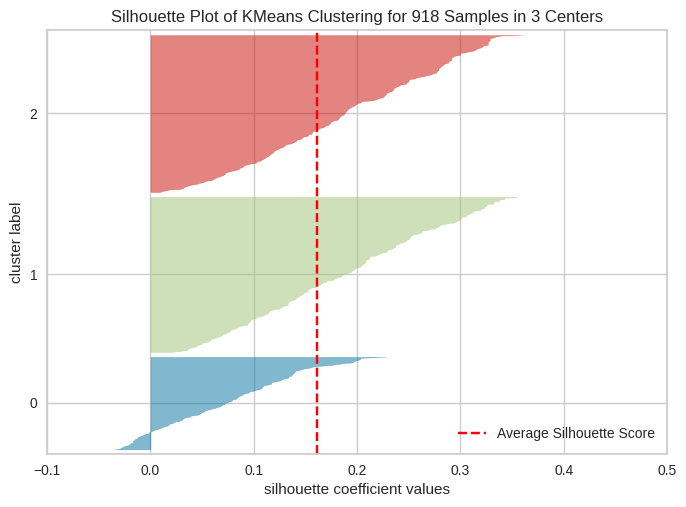

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 918 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
!pip install yellowbrick
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import pandas as pd  # Import pandas


scaler = StandardScaler()
scaled_data = scaler.fit_transform(scaled_data)

kmeans = KMeans(n_clusters=3, n_init='auto')

# Set the color theme for the visualizer using a valid colormap
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')

# Fit the visualizer on the scaled data
visualizer.fit(scaled_data)

# Show the silhouette plot
visualizer.show()

The silhouette plot for KMeans clustering with 3 centers shows that most data points have positive silhouette scores, indicating they are generally well assigned to their respective clusters and maintain a decent distance from others.

This suggests a fair level of cluster separation, with the clustering structure being reasonably clear. However, the existence of some samples with scores near or below zero points to possible overlap or misclassification, where a few points may lie closer to neighboring clusters than their assigned ones.

**Calculating the Within-Cluster Sum of Squares (WSS) and the Average Silhouette Score**

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np

X_scaled = scaled_data

# Perform KMeans clustering with k=3 clusters
kmeans_model = KMeans(n_clusters=3, random_state=42, n_init=10)
kmeans_model.fit(X_scaled)
cluster_labels = kmeans_model.labels_

# Calculate WSS
wss_value = kmeans_model.inertia_

# Compute the Silhouette Score for the clusters
avg_silhouette = silhouette_score(X_scaled, cluster_labels)

# Output the WSS and the Silhouette Score
print(f"Within-Cluster Sum of Squares (WSS):" ,wss_value)
print(f"Average Silhouette Score:" , avg_silhouette)

Within-Cluster Sum of Squares (WSS): 6576.0723231369
Average Silhouette Score: 0.1858655312451745


The K-Means clustering with 3 clusters resulted in a WSS of 6576.07 and an Average Silhouette Score of 0.186.

This suggests that while the clusters show moderate separation, they are not highly compact or well-defined. The relatively low silhouette score indicates that there may be some overlap or ambiguity between clusters, and the clustering solution could potentially be improved by adjusting the number of clusters or exploring alternative clustering methods.

**K=4**


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

np.random.seed(8953)

# Perform K-means clustering for K=4
kmeans = KMeans(n_clusters=4, random_state=8953, n_init='auto')  # Set n_init explicitly
kmeans_result= kmeans.fit(scaled_data)

#Print the clustering result
print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result. labels_)

Cluster Centers:
[[-4.42822203e-01  5.15952417e-01  3.63669197e-01 -2.21743331e-01
   1.29242497e-03 -4.26451583e-01  5.10197971e-01 -6.89047889e-01
  -6.21205764e-01  6.22387196e-01]
 [ 3.20628891e-01  2.60865128e-01 -4.87065285e-01  2.12593074e-01
   3.16239969e-02 -5.51341340e-01 -6.44932572e-01  9.51303834e-01
   6.84486231e-01 -6.55153108e-01]
 [-2.70796156e-01 -1.93816322e+00  4.76775296e-01 -2.22097857e-01
   3.27108456e-01 -3.33503203e-01  5.82032428e-01 -6.76083756e-01
  -4.57568072e-01  5.75005614e-01]
 [ 4.66742840e-01  3.55901397e-01 -2.54186941e-01  2.26269760e-01
  -3.20299920e-01  1.81375843e+00 -3.43058297e-01  2.50719954e-01
   3.63065408e-01 -5.06502480e-01]]

Cluster Labels:
[0 2 0 1 0 0 2 0 1 2 2 1 0 1 2 2 0 2 1 0 2 0 2 1 0 0 1 0 2 0 0 0 1 1 2 0 3
 2 2 1 2 2 0 0 1 1 0 0 0 0 1 1 0 2 1 2 1 0 0 1 0 2 0 1 2 2 2 0 1 0 1 0 0 2
 1 0 0 2 0 0 0 0 1 0 3 1 3 1 0 1 2 0 2 1 2 1 0 0 0 0 1 0 2 3 0 0 2 0 0 0 2
 1 3 0 2 2 0 3 2 0 2 2 0 1 0 0 2 2 2 1 0 1 1 1 1 0 2 0 1 1 1 1 1 0 2 0 0

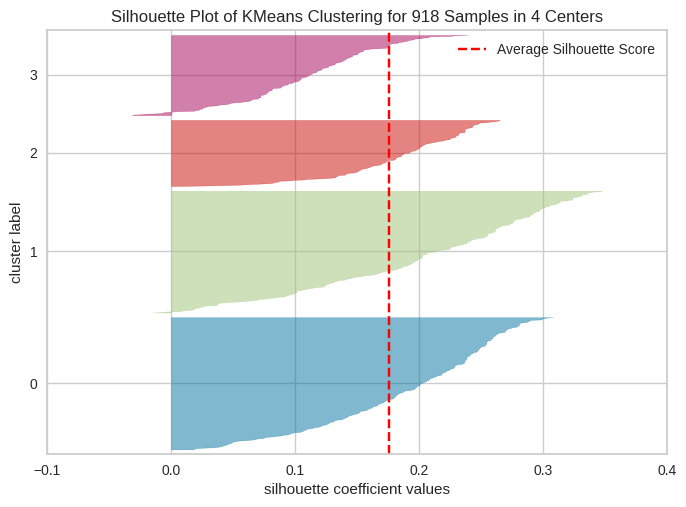

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 918 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
!pip install yellowbrick
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import pandas as pd  # Import pandas


scaler = StandardScaler()
scaled_data = scaler.fit_transform(scaled_data)

kmeans = KMeans(n_clusters=4, n_init='auto')

# Set the color theme for the visualizer using a valid colormap
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')

# Fit the visualizer on the scaled data
visualizer.fit(scaled_data)

# Show the silhouette plot
visualizer.show()

The silhouette plot for KMeans clustering with 4 centers shows that most data points have positive silhouette scores, meaning they are generally well grouped within their clusters and moderately separated from others.

However, with an average silhouette score of around 0.2, the overall cluster separation is fairly weak. Some samples fall near zero or even into the negative range, suggesting that a number of data points lie close to cluster boundaries, resulting in overlap and potential misclassification. While the clustering isn't poor, it's not particularly strong or well-defined either.

**Calculating the Within-Cluster Sum of Squares (WSS) and the Average Silhouette Score**

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np

X_scaled = scaled_data

# Perform KMeans clustering with k=4 clusters
kmeans_model = KMeans(n_clusters=4, random_state=42, n_init=10)
kmeans_model.fit(X_scaled)
cluster_labels = kmeans_model.labels_

# Calculate WSS
wss_value = kmeans_model.inertia_

# Compute the Silhouette Score for the clusters
avg_silhouette = silhouette_score(X_scaled, cluster_labels)

# Output the WSS and the Silhouette Score
print(f"Within-Cluster Sum of Squares (WSS):" ,wss_value)
print(f"Average Silhouette Score:" , avg_silhouette)

Within-Cluster Sum of Squares (WSS): 5968.303218123003
Average Silhouette Score: 0.17561137851742672


The K-Means clustering with 4 clusters resulted in a WSS of 5968.30 and an Average Silhouette Score of 0.176.

This indicates a slight improvement in compactness compared to higher WSS values, but the silhouette score remains low. This suggests moderate separation with possible overlap, and the clusters are not highly distinct or well-defined. Further tuning or alternative clustering methods may be needed for better structure.

# Review of the Three Clustering Setups:

**1. WSS: 7257.779, Silhouette Score: 0.199**

Explanation: This setup has the highest silhouette score, meaning the clusters are more clearly separated from each other. However, the high WSS shows that the clusters are not very compact and are more spread out.

**2. WSS: 6576.07, Silhouette Score: 0.186**

Explanation: This option has a lower WSS than the first one, meaning the clusters are a bit tighter. But the silhouette score is also lower, which means the clusters are not as well separated.

*3. WSS: 5968.30, Silhouette Score: 0.176*

Explanation: This setup gives the tightest clusters, as shown by the lowest WSS. Still, it has the lowest silhouette score, which suggests the clusters are not clearly separated.

**Conclusion:**


The first configuration offers the best trade-off. While its clusters are less compact, the higher silhouette score means the groups are more clearly defined. This makes it the most suitable choice for meaningful clustering results.

# Final Choice:

**Summary of Results**


---


After evaluating the clustering results using WSS (Within-Cluster Sum of Squares) and the average Silhouette score, we found that choosing K = 2 is the most effective option for our model. This is mainly because it yields the highest Silhouette score among all tested values, showing that the clusters are more clearly separated and internally cohesive compared to when K = 3 or K = 4. While the WSS is higher at K = 2—a normal outcome since WSS usually drops as K increases—the strong Silhouette score indicates that K = 2 offers the best balance between cluster compactness and distinction, making it the preferred configuration.


#7- Findings

We started by choosing a dataset of patients diagnosed with heart disease to uncover the key factors behind this serious condition and inform targeted prevention strategies. To ensure our findings were both accurate and reliable, we first cleaned and optimized the data through a series of preprocessing steps. We then used a variety of visualizations—pie charts, box plots, scatter plots, and bar graphs—to explore the data and guide our next steps. Drawing on these insights, we removed any empty records, missing entries, or extreme outliers that might have distorted our results.

After cleaning, we transformed the dataset by normalizing values, partitioning features, and applying balancing techniques to give each variable fair representation and streamline the subsequent analysis. With the data primed, we proceeded to our mining tasks: classification and clustering. For classification, we evaluated models using both the Gini index and information gain. By experimenting with three different train–test split ratios, we identified the setup that delivered the strongest performance for model building and evaluation. Here are our findings:

#7.1.1 Information Gain




In [ ]:
data = {
        "Percentages": [
        "Accuracy", "Error Rate", "Sensitivity", "Specificity", "Precision"
    ],
    "70% training, 30% testing": [
        "0.7645", "0.2355", " 0.7605", "0.7706", "0.8355"
    ],
    "60% training, 40% testing	": [
        "0.7744", "0.2255", "0.7627", "0.7908	","0.8367"
    ],
    "	80% training, 20% testing": [
        "0.8098", "0.1902", "0.8182", "0.7973","0.8571"
    ]
}
g = pd.DataFrame(data)
g.style.set_properties(**{'text-align': 'center'})

,Percentages,"70% training, 30% testing","60% training, 40% testing","80% training, 20% testing"
0,Accuracy,0.7645,0.7744,0.8098
1,Error Rate,0.2355,0.2255,0.1902
2,Sensitivity,0.7605,0.7627,0.8182
3,Specificity,0.7706,0.7908,0.7973
4,Precision,0.8355,0.8367,0.8571


Based on the results presented for the models trained using different data splits, the following observations can be made:

- **Accuracy:** The model trained with an 80% training set and 20% testing set achieved the highest accuracy (80.98%). This indicates that a larger training set improves overall model performance.

- **Error Rate:** The error rate is lowest for the 80%–20% split (19.02%), showing that this configuration minimizes incorrect predictions more effectively than the others.

- **Sensitivity:** Sensitivity rises to 81.82% with the 80%–20% split, meaning the model is better at correctly identifying positive cases when given more training data.

- **Specificity:** The highest specificity (79.73%) also occurs with the 80%–20% split, indicating improved ability to correctly identify negative cases.

- **Precision:** Precision peaks at 85.71% for the model trained on 80% of the data, reflecting fewer false positives and more reliable positive predictions.

Based on the values, increasing the proportion of data allocated to training leads to consistent gains across every metric. The 80% training / 20% testing split delivers the best overall performance, demonstrating that a larger training set helps the model generalize more accurately.

# 7.1.2 GINI INDEX

In [ ]:
import pandas as pd # Changed 'import pd as pandas' to 'import pandas as pd'
data = {
        "Percentages": [
        "Accuracy", "Error Rate", "Sensitivity", "Specificity", "Precision"
    ],

    "70% training, 30% testing": [
        " 0.7789", "0.2210", "0.7964", "0.7522", " 0.8312"
    ],
    "60% training, 40% testing	": [
        "0.7608", "0.2391", "0.7488", "0.7777", "0.8256"
    ],
    "	80% training, 20% testing": [
        "0.8043", "0.1956", "0.8000", "0.8108	","0.8627"
    ]
}
g = pd.DataFrame(data)
g.style.set_properties(**{'text-align': 'center'})

,Percentages,"70% training, 30% testing","60% training, 40% testing","80% training, 20% testing"
0,Accuracy,0.7789,0.7608,0.8043
1,Error Rate,0.2210,0.2391,0.1956
2,Sensitivity,0.7964,0.7488,0.8000
3,Specificity,0.7522,0.7777,0.8108
4,Precision,0.8312,0.8256,0.8627


Using these five metrics, we can see how each train–test split performs on our data:

- **Accuracy**  
  The overall proportion of correct predictions. Our models achieve **77.89%**, **76.08%**, and **80.43%** accuracy for the 70/30, 60/40, and 80/20 splits, respectively—peaking at 80.43% when 80% of the data is used for training.

- **Error Rate**  
  The share of incorrect predictions. This falls from 22.11% (70/30) and 23.91% (60/40) down to **19.56%** with an 80/20 split, showing that the largest training set yields the fewest misclassifications.

- **Sensitivity (Recall)**  
  The ability to correctly identify positive cases. Sensitivity rises from 79.64% and 74.88% to **80.00%** under the 80/20 split, meaning the model best detects true positives when given more data.

- **Specificity**  
  The ability to correctly identify negative cases. Specificity improves from 75.22% and 77.77% to **81.08%** at 80/20, indicating stronger detection of true negatives.

- **Precision**  
  The proportion of positive predictions that are actually correct. Precision climbs from 83.12% and 82.56% to **86.27%** with the 80/20 split, reflecting the fewest false‑positive errors.

By comparing these values, it’s clear that the model trained on 80% of the data outperforms the others across every metric, making it the best choice for accurate and reliable predictions.

# The best model between information gain and the Gini index

In [ ]:
import pandas as pd

data = {
    " ": [
        "Accuracy", "Error Rate", "Sensitivity","Specificity","Precision"
    ],
    "Information Gain": [
        "0.8098",  "0.1902","0.8182","0.7973","0.8571"
    ],
    "Gini Index": [
        "0.8043", "0.1956","0.8000","0.8108","0.8627"
    ]
}

g = pd.DataFrame(data)
g.style.set_properties(**{'text-align': 'center'})


,,Information Gain,Gini Index
0,Accuracy,0.8098,0.8043
1,Error Rate,0.1902,0.1956
2,Sensitivity,0.8182,0.8000
3,Specificity,0.7973,0.8108
4,Precision,0.8571,0.8627


# Accuracy and Error Rate

Information Gain yields an accuracy of **80.98%** (0.8098), just above the Gini Index’s **80.43%** (0.8043). While both methods are closely matched in their ability to classify heart‑disease cases, Information Gain holds a slight advantage in overall correctness. It also produces a marginally lower error rate **19.02%** (0.1902) versus **19.56%** (0.1956) for Gini

which suggests it may be a touch more dependable by cutting down on misclassifications that could impact patient treatment.

# Sensitivity and Specificity:

With an 80 / 20 split, Information Gain achieves a sensitivity of **81.82%** (0.8182), outperforming the Gini Index’s **80.00%** (0.8000). This means the Information Gain based model is slightly better at correctly flagging true positives. Conversely, the Gini Index reaches a specificity of **81.08%** (0.8108), compared to Information Gain’s **79.73%** (0.7973), indicating it has the edge in accurately identifying true negatives. Together, these results suggest that while Information Gain is marginally stronger at detecting positive cases, the Gini Index is a bit more reliable at ruling out negatives.

# Precision

The Gini Index posts a precision of 86.27% (0.8627), just above Information Gain’s 85.71% (0.8571). This advantage means the Gini driven model makes slightly fewer false‑positive predictions, enhancing its reliability when identifying true positive cases.



# Conclusion

Both criteria deliver strong results but shine in different areas: Information Gain leads in overall accuracy (80.98%), error rate (19.02%), and sensitivity (81.82%), making it the better choice when catching true positives is key. Gini Index, with higher specificity (81.08%) and precision (86.27%), is slightly more reliable at ruling out negatives and avoiding false positives. Your choice hinges on whether you prioritize detecting positive cases (pick Information Gain) or minimizing misclassified negatives (pick Gini).

Below is the decision tree for the 80 / 20 split:

In [ ]:
from sklearn.tree import plot_tree, DecisionTreeClassifier
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import LabelEncoder

data = pd.read_csv('Preprocessed_dataset.csv')
fn = data.keys().tolist()[:-1]
X = data[fn]
y = data['HeartDisease']


le = LabelEncoder()

categorical_cols = ['Age', 'Cholesterol', 'RestingBP', 'MaxHR', 'Oldpeak']
for col in categorical_cols:
    if col in X.columns:
        X[col] = le.fit_transform(X[col])

clf = DecisionTreeClassifier()
clf.fit(X, y)

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=500)

class_labels = {1: '1(HeartDisease)', 0: '0(Not HeartDisease)'}

plot_tree(clf,
          feature_names=X.columns,
          class_names=[class_labels[0], class_labels[1]],
          filled=True
          )

plt.show()

<ipython-input-31-fd3028076e01>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[col] = le.fit_transform(X[col])
<ipython-input-31-fd3028076e01>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[col] = le.fit_transform(X[col])
<ipython-input-31-fd3028076e01>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

The heart‐disease decision tree relies on key predictors—Age, Sex, ChestPainType, RestingBP, Cholesterol, FastingBS, MaxHR, ExerciseAngina, Oldpeak, and ST_Slope—ordering splits by each feature’s contribution. Beginning with the single most informative attribute, it then branches on the remaining factors in descending order of importance. Leaf nodes assign a class label (0 for Heart Disease, 1 for No Heart Disease) based on specific attribute combinations. This layered design captures how these variables interact to separate patients with and without heart disease, offering clear insight into the model’s decision process.

# 7.2 Clustering

We used a range of clustering evaluation methods to pinpoint the ideal number of clusters (K) in our data. By computing the average silhouette score for each K value, we arrived at these findings:

In [ ]:
import pandas as pd

data = {
    " ": ["WSS", "Silhouette"],
    "k=2": ["7257.779", "0.19879718749735742"],
    "k=3": ["6576.07", "0.1858655312451745"],
    "k=4": ["5968.30 ", "0.17561137851742672"]
}

# Convert the data into a DataFrame
df = pd.DataFrame(data)

g = pd.DataFrame(data)
g.style.set_properties(**{'text-align': 'center'})

,,k=2,k=3,k=4
0,WSS,7257.779,6576.07,5968.30
1,Silhouette,0.19879718749735742,0.1858655312451745,0.17561137851742672


The highest silhouette score occurs at k=2, and its WSS remains sufficiently large

while the silhouette plot for two clusters shows the most clearly separated, cohesive groups. Thus, K=2 is the optimal choice for our dataset.









# The corresponding plot chart

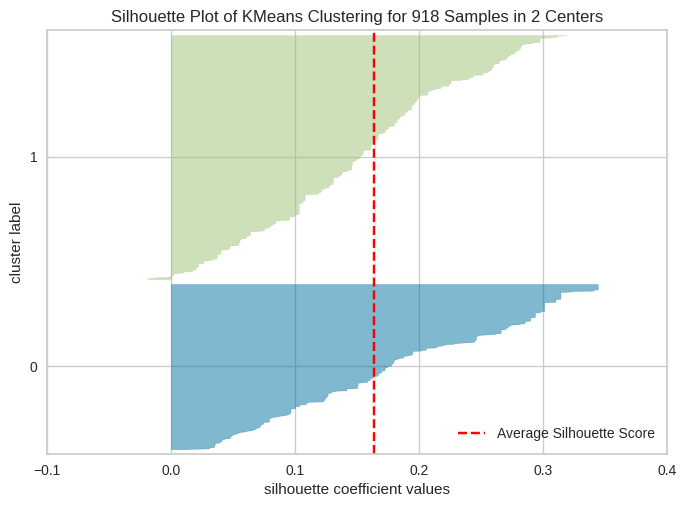

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 918 Samples in 2 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:

!pip install yellowbrick
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import pandas as pd  # Import pandas


scaler = StandardScaler()
scaled_data = scaler.fit_transform(scaled_data)

kmeans = KMeans(n_clusters=2, n_init='auto')

# Set the color theme for the visualizer using a valid colormap
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')

# Fit the visualizer on the scaled data
visualizer.fit(scaled_data)

# Show the silhouette plot
visualizer.show()

The K‑means silhouette plot shows mostly positive scores, meaning that most points sit comfortably within their own clusters and are well separated from others. This demonstrates effective grouping overall. However, predominantly positive values don’t guarantee a flawless partition points near cluster boundaries can still yield scores around zero or even negative, revealing some overlap or ambiguity between clusters.

 **Finally**

Our clustering analysis offered valuable insights into patient groupings, but because our dataset labels heart‐disease status, supervised classifiers ultimately deliver more precise risk predictions. By leveraging known outcomes, these models better pinpoint the factors driving heart disease and support targeted prevention strategies.

## **8- References**

1.    F. Soriano, "Heart Failure Prediction Dataset," Kaggle, 2021. [Online]. Available:
https:https://www.kaggle.com/code/parsalatifi/heart-failure-prediction-95-accuracy-score.

2.    B. Siontis, V. M. Noseworthy, P. Attia, and Y. V. Murad, "Artificial
Intelligence in Heart Disease Diagnosis," PubMed,
vol. 72, no. 10, pp. 1101–1111, 2019. [Online]. Available: https://pubmed.ncbi.nlm.nih.gov/31592122/.